**3D UNet, SCAFFOLD**

**Imports & Drive Mount**

In [1]:
#!pip install monai nibabel torch torchvision torchmetrics -q

In [2]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from monai.transforms import LoadImaged, EnsureChannelFirstd, Compose, ResizeWithPadOrCropd, NormalizeIntensityd, Orientationd
from monai.networks.nets import UNet
from monai.losses import DiceLoss
from monai.metrics import DiceMetric, HausdorffDistanceMetric
from glob import glob
import copy
#from google.colab import drive

import random
import nibabel as nib
import numpy as np

from torch.utils.tensorboard import SummaryWriter
import matplotlib.pyplot as plt
from tqdm import tqdm
import warnings
import shutil

In [3]:
#supress warnings for cleaner console output
warnings.filterwarnings("ignore", category=FutureWarning, module="monai")

In [4]:
# Mount Google Drive
# from google.colab import drive
# drive.mount('/content/drive')

data_dir = "D:/F25-156/ISLES22_split"
print(data_dir)

D:/F25-156/ISLES22_split


In [5]:
#save checkpoint and tensorboard logs in drive
checkpoint_dir = "D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints"
log_dir = "D:/F25-156/UNet 3D/Federated_UNet3D_logs"

# Remove old directories if they exist
if os.path.exists(checkpoint_dir):
    shutil.rmtree(checkpoint_dir)

if os.path.exists(log_dir):
    shutil.rmtree(log_dir)

# Recreate directories
os.makedirs(checkpoint_dir)
os.makedirs(log_dir)

writer = SummaryWriter(log_dir=log_dir)
print(f"Checkpoints will be saved to: {checkpoint_dir}")
print(f"TensorBoard logs will be saved to: {log_dir}")

%load_ext tensorboard
%tensorboard --logdir "D:/F25-156/UNet 3D/Federated_UNet3D_logs"

Checkpoints will be saved to: D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints
TensorBoard logs will be saved to: D:/F25-156/UNet 3D/Federated_UNet3D_logs


In [6]:
def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seed(42)

**MONAI Preprocessing Transforms**

In [7]:
# Target shape for all volumes
target_shape = (96,96,96)

sample_transform = Compose([
    LoadImaged(keys=["image"]),
    EnsureChannelFirstd(keys=["image"]),
    Orientationd(keys=["image"], axcodes="RAS"),
    ResizeWithPadOrCropd(keys=["image"], spatial_size=target_shape),
    NormalizeIntensityd(keys=["image"], nonzero=True)
])

mask_transform = Compose([
    LoadImaged(keys=["image"]),
    EnsureChannelFirstd(keys=["image"]),
    Orientationd(keys=["image"], axcodes="RAS"),
    ResizeWithPadOrCropd(
        keys=["image"],
        spatial_size=target_shape,
        mode="constant"
    )
])


**Dataset Class**

In [8]:
def load_dwi_mask_pairs(base_path):
    dwi_files = sorted(glob(os.path.join(base_path, "DWI", "*.nii*")))
    mask_files = sorted(glob(os.path.join(base_path, "masks", "*.nii*")))
    assert len(dwi_files) == len(mask_files), f"Mismatch in {base_path}"
    return dwi_files, mask_files


In [9]:
class ISLESDataset(Dataset):
    def __init__(self, dwi_files, mask_files,
                 image_transform=None,
                 mask_transform=None):

        assert len(dwi_files) == len(mask_files)

        self.dwi_files = dwi_files
        self.mask_files = mask_files
        self.image_transform = image_transform
        self.mask_transform = mask_transform

    def __len__(self):
        return len(self.dwi_files)

    def __getitem__(self, idx):

        image_dict = {"image": self.dwi_files[idx]}
        mask_dict = {"image": self.mask_files[idx]}

        if self.image_transform:
            image_dict = self.image_transform(image_dict)

        if self.mask_transform:
            mask_dict = self.mask_transform(mask_dict)

        image = image_dict["image"].float()
        mask = mask_dict["image"].long()

        return {"image": image, "mask": mask}

**Load Files and Apply MONAI Transforms**

**Split into “Clients” (Federated Simulation)**


Client 0 - Raw Samples:
Sample 40 | Image shape: (128, 128, 25) | Mask shape: (128, 128, 25) | Mask Values: tensor([0.0000, 1.0000], dtype=torch.float64)


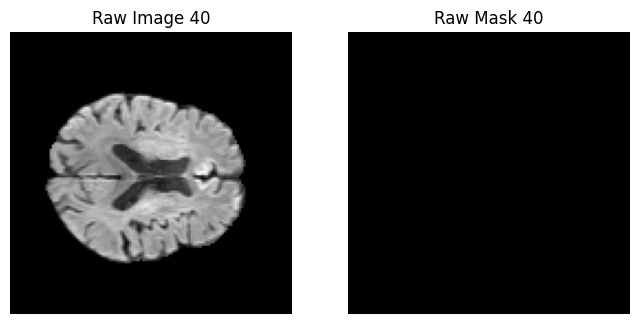

Sample 7 | Image shape: (112, 112, 73) | Mask shape: (112, 112, 73) | Mask Values: tensor([0., 1.], dtype=torch.float64)


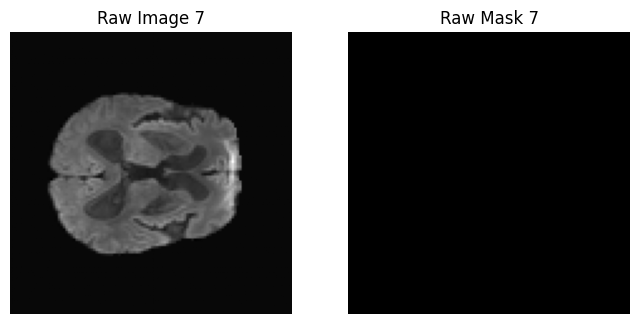

Client 0 - Preprocessed Samples:
Sample 40 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


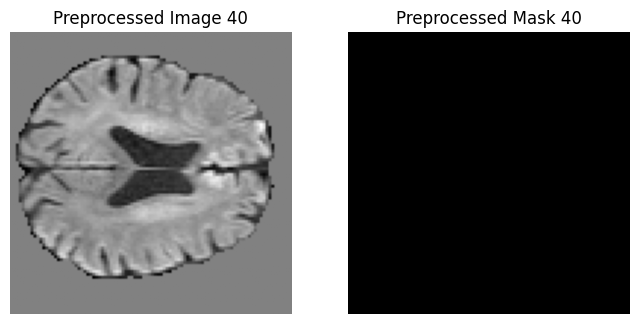

Sample 7 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


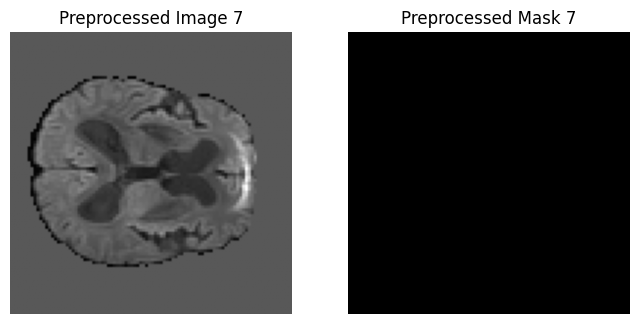

Client 0 samples: 50

Client 1 - Raw Samples:
Sample 1 | Image shape: (112, 112, 72) | Mask shape: (112, 112, 72) | Mask Values: tensor([0., 1.], dtype=torch.float64)


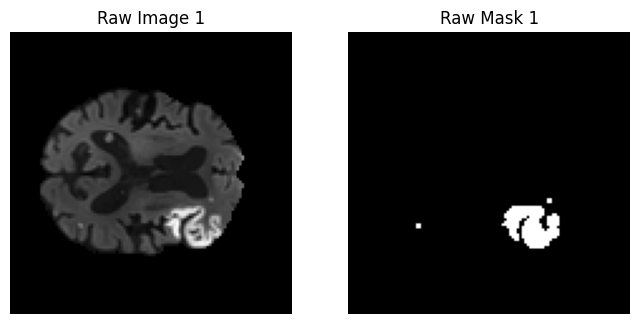

Sample 47 | Image shape: (192, 192, 30) | Mask shape: (192, 192, 30) | Mask Values: tensor([0.0000, 1.0000], dtype=torch.float64)


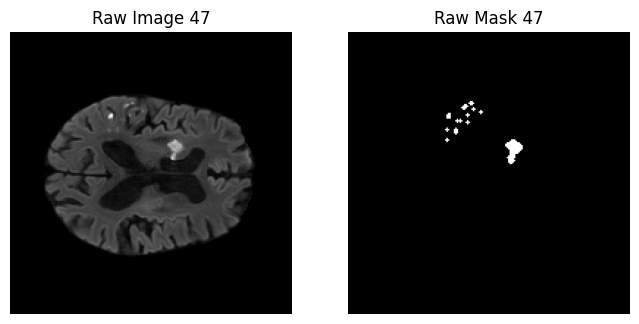

Client 1 - Preprocessed Samples:
Sample 1 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


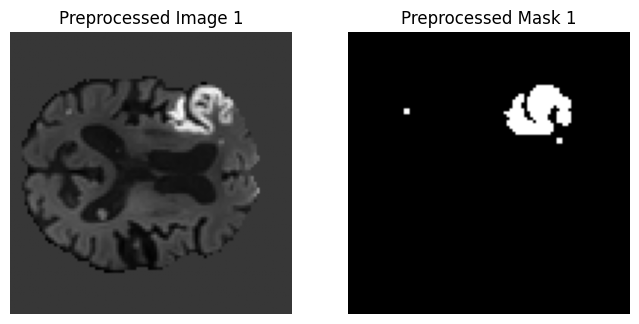

Sample 47 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


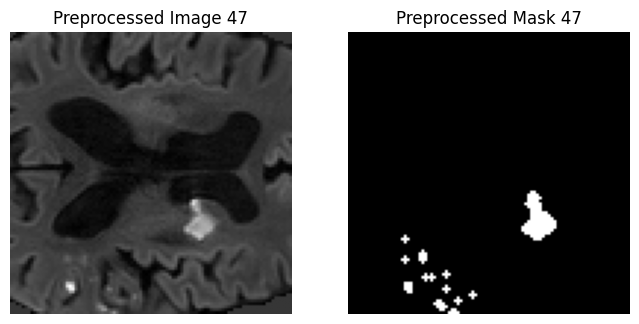

Client 1 samples: 50

Client 2 - Raw Samples:
Sample 17 | Image shape: (112, 112, 72) | Mask shape: (112, 112, 72) | Mask Values: tensor([0., 1.], dtype=torch.float64)


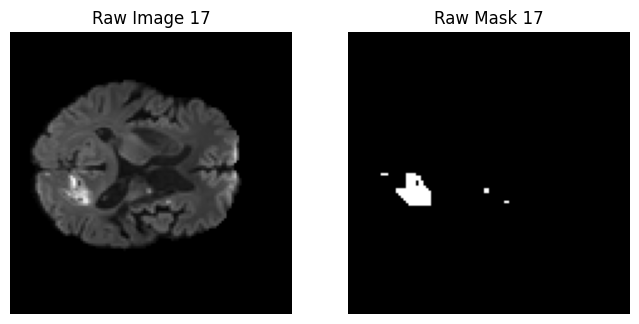

Sample 15 | Image shape: (112, 112, 72) | Mask shape: (112, 112, 72) | Mask Values: tensor([0., 1.], dtype=torch.float64)


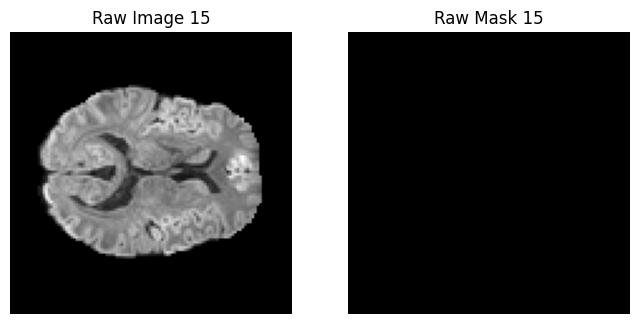

Client 2 - Preprocessed Samples:
Sample 17 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


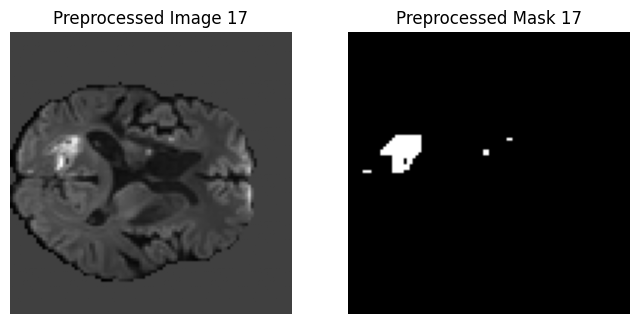

Sample 15 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


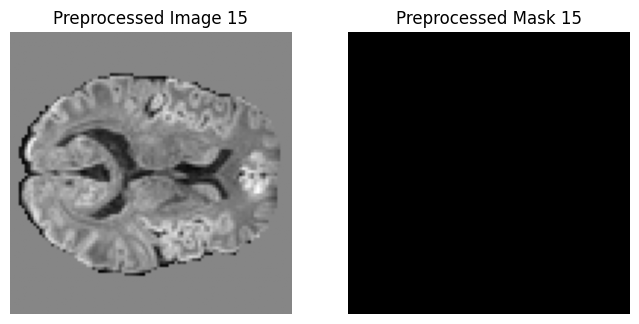

Client 2 samples: 50


In [10]:
num_clients = 3
client_datasets = []

for i in range(num_clients):
    client_path = os.path.join(data_dir, "train", f"client_{i}")
    dwi_files, mask_files = load_dwi_mask_pairs(client_path)

    # -----------------------------
    # Visualize 2 random raw samples
    # -----------------------------
    sample_indices = random.sample(range(len(dwi_files)), k=2)
    print(f"\nClient {i} - Raw Samples:")
    for idx in sample_indices:
        img = nib.load(dwi_files[idx]).get_fdata()
        mask = nib.load(mask_files[idx]).get_fdata()
        mask_tensor = torch.from_numpy(mask)
        
        print(f"Sample {idx} | Image shape: {img.shape} | Mask shape: {mask.shape} | Mask Values: {torch.unique(mask_tensor)}")  #make sure mask only contains 0 and 1

        mid_slice = img.shape[2] // 2  # middle slice
        plt.figure(figsize=(8,4))
        plt.subplot(1,2,1)
        plt.imshow(img[:,:,mid_slice], cmap="gray")
        plt.title(f"Raw Image {idx}")
        plt.axis("off")
        plt.subplot(1,2,2)
        plt.imshow(mask[:,:,mid_slice], cmap="gray")
        plt.title(f"Raw Mask {idx}")
        plt.axis("off")
        plt.show()

    # -----------------------------
    # Create preprocessed dataset
    # -----------------------------
    ds = ISLESDataset(
        dwi_files=dwi_files,
        mask_files=mask_files,
        image_transform=sample_transform,
        mask_transform=mask_transform
    )
    client_datasets.append(ds)

    # -----------------------------
    # Visualize 2 random preprocessed samples
    # -----------------------------
    print(f"Client {i} - Preprocessed Samples:")
    for idx in sample_indices:
        sample = ds[idx]
        img_proc = sample["image"][0].numpy()  # remove channel
        mask_proc = sample["mask"][0].numpy()
        print(f"Sample {idx} | Image shape: {img_proc.shape} | Mask shape: {mask_proc.shape}  | Mask Values: {torch.unique(sample['mask'])}")

        mid_slice = img_proc.shape[2] // 2
        plt.figure(figsize=(8,4))
        plt.subplot(1,2,1)
        plt.imshow(img_proc[:,:,mid_slice], cmap="gray")
        plt.title(f"Preprocessed Image {idx}")
        plt.axis("off")
        plt.subplot(1,2,2)
        plt.imshow(mask_proc[:,:,mid_slice], cmap="gray")
        plt.title(f"Preprocessed Mask {idx}")
        plt.axis("off")
        plt.show()

    print(f"Client {i} samples: {len(ds)}")

**Validation Set**

In [11]:
val_dwi, val_masks = load_dwi_mask_pairs(os.path.join(data_dir, "val"))

val_dataset = ISLESDataset(
    dwi_files=val_dwi,
    mask_files=val_masks,
    image_transform=sample_transform,
    mask_transform=mask_transform
)

val_loader = DataLoader(val_dataset, batch_size=1, shuffle=False)

print("Validation samples:", len(val_dataset))

Validation samples: 50


UNet

In [12]:
print("CUDA version:", torch.version.cuda)
print("CUDA available:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

CUDA version: 12.1
CUDA available: True
GPU: NVIDIA RTX A4000


In [13]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

def create_model():
    model = UNet(
        spatial_dims=3,
        in_channels=1,
        out_channels=1,
        channels=(16, 32, 64, 128),
        strides=(2, 2, 2),
        num_res_units=2
    ).to(device)
    print(model)
    return model

Using device: cuda:0


**Client Class**

In [14]:
class Client:
    def __init__(self, client_id, dataset, device):
        self.id = client_id
        self.loader = DataLoader(dataset, batch_size=1, shuffle=True)
        self.device = device
        self.model = create_model().to(device)
        self.optimizer = optim.SGD(self.model.parameters(), lr=1e-2, momentum=0) #SCAFFOLD uses SGD instead of Adam
        
        # --- SCAFFOLD CHANGE START ---
        # client control variate c_i
        self.c_i = {name: torch.zeros_like(param).to(device) 
                    for name, param in self.model.named_parameters()}
        # --- SCAFFOLD CHANGE END ---

        self.dice_loss = DiceLoss(sigmoid=True)
        self.bce_loss = nn.BCEWithLogitsLoss()

        self.dice_metric = DiceMetric(include_background=False, reduction="mean")
        self.hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

    def loss_fn(self, y_pred, y_true):
        return 0.7*self.dice_loss(y_pred, y_true) + 0.3*self.bce_loss(y_pred, y_true)

    def get_parameters(self):
        return {k: v.cpu().clone() for k, v in self.model.state_dict().items()}

    def set_parameters(self, parameters):
        self.model.load_state_dict(parameters)
        
    # --- SCAFFOLD CHANGE START ---
    # server also sends control variate c
    def set_server_control(self, c):
        self.c = {k: v.clone().to(self.device) for k, v in c.items()}
    # --- SCAFFOLD CHANGE END ---


    def train_epochs(self, num_epochs=1):
        self.model.train()
        total_loss = 0
        
        # --- SCAFFOLD CHANGE START ---
        # store initial parameters to compute update later
        global_params = {name: param.clone().detach()
                         for name, param in self.model.named_parameters()}
        # count local steps
        local_steps = 0
        # --- SCAFFOLD CHANGE END ---

        # Progress bar for epochs
        for epoch in tqdm(range(1, num_epochs + 1), desc=f"Client {self.id} Epochs", leave=True):
            epoch_loss = 0

            for batch in self.loader:
                images = batch["image"].to(self.device, dtype=torch.float32)
                masks = batch["mask"].to(self.device, dtype=torch.float32)

                self.optimizer.zero_grad()
                outputs = self.model(images)
                loss = self.loss_fn(outputs, masks)

                loss.backward()
                
                # --- SCAFFOLD CHANGE START ---
                # modify gradients using control variates
                for name, param in self.model.named_parameters():
                    if param.grad is not None:
                        param.grad -= self.c_i[name]
                        param.grad += self.c[name]
                # --- SCAFFOLD CHANGE END ---
                
                self.optimizer.step()
                local_steps += 1

                total_loss += loss.item()
                epoch_loss += loss.item()

                # Metrics for monitoring
                pred_binary = (torch.sigmoid(outputs) > 0.5).float()
                self.dice_metric(pred_binary, masks)
                if masks.sum() > 0 and pred_binary.sum() > 0:
                  self.hd_metric(pred_binary, masks)

            # Compute metrics at the end of the epoch
            mean_dice = self.dice_metric.aggregate().item()
            # mean_hd95 = self.hd_metric.aggregate().item()
            try:
                mean_hd95 = self.hd_metric.aggregate().item()
            except ValueError:
                mean_hd95 = float('nan')  # or 0
            mean_iou = mean_dice / (2 - mean_dice)

            # Print per-epoch metrics
            print(f"Client {self.id} | Epoch {epoch}/{num_epochs} | "
                  f"Loss: {epoch_loss/len(self.loader):.4f} | Dice: {mean_dice:.4f} | "
                  f"IoU: {mean_iou:.4f} | HD95: {mean_hd95:.4f}")

            # Reset metrics for next epoch
            self.dice_metric.reset()
            self.hd_metric.reset()

        # Average loss across all epochs
        avg_loss = total_loss / (len(self.loader) * num_epochs)
        
        # --- SCAFFOLD CHANGE START ---
        # update client control variate
        new_c_i = {}
        delta_c_i = {}

        lr = self.optimizer.param_groups[0]["lr"] 
        for name, param in self.model.named_parameters():
            # diff = (initial_params - final_params)
            diff = global_params[name] - param.detach()
            
            # K is local_steps (total batches processed)
            # new_c_i_plus = c_i - c + (diff / (K * lr))
            new_c_i_plus = self.c_i[name] - self.c[name] + (diff / (local_steps * lr))

            delta_c_i[name] = new_c_i_plus - self.c_i[name]
            new_c_i[name] = new_c_i_plus

        # update client control
        self.c_i = new_c_i
        print("mean |c_i|:", torch.mean(
            torch.stack([v.abs().mean() for v in self.c_i.values()])
        ))
        print("max |c_i|:", max(v.abs().max().item() for v in self.c_i.values()))
        # --- SCAFFOLD CHANGE END ---

        # Return last epoch metrics 
        return avg_loss, mean_dice, mean_iou, mean_hd95, delta_c_i

**Server Class**

In [15]:
class Server:
    def __init__(self, val_loader, device, server_lr=1):
        self.device = device
        self.global_model = create_model().to(device)
        self.val_loader = val_loader
        self.server_lr=server_lr #ng
        
        # --- SCAFFOLD CHANGE START ---
        # server control variate
        self.c = {name: torch.zeros_like(param).to(device)
            for name, param in self.global_model.named_parameters()}
        # --- SCAFFOLD CHANGE END ---

        self.dice_loss = DiceLoss(sigmoid=True)
        self.bce_loss = nn.BCEWithLogitsLoss()

        self.dice_metric = DiceMetric(include_background=False, reduction="mean")
        self.hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

        self.best_dice = 0.0

    def loss_fn(self, y_pred, y_true):
        return 0.7*self.dice_loss(y_pred, y_true) + \
               0.3*self.bce_loss(y_pred, y_true)

    
    def aggregate(self, client_params_list, delta_c_list):

        global_params = self.global_model.state_dict()
        new_params = {}
        
        # find delta (new clients - old global)
        for key in global_params.keys():

            # if not a learnable parameter (not a float tensor), skip it
            if not torch.is_floating_point(global_params[key]):
                new_params[key] = global_params[key]
                continue

            delta = torch.zeros_like(global_params[key])

            for client in client_params_list:
                delta += client[key].to(self.device) - global_params[key]

            delta /= len(client_params_list)  # |S|

            new_params[key] = global_params[key] + self.server_lr * delta

        self.global_model.load_state_dict(new_params)

        # ---- Control variate update ----
        for name in self.c.keys():

            update = torch.zeros_like(self.c[name])

            for delta_c in delta_c_list:
                update += delta_c[name].to(self.device)

            update /= num_clients   # 1/N

            self.c[name] += update

    def distribute(self, clients):
        global_params = self.global_model.state_dict()
        for client in clients:
            client.set_parameters(global_params)
            
            # --- SCAFFOLD CHANGE START ---
            # send server control variate to clients
            client.set_server_control(self.c)
            # --- SCAFFOLD CHANGE END ---

    def validate(self):
        self.global_model.eval()
        val_loss = 0

        with torch.no_grad():
            for batch in self.val_loader:
                images = batch["image"].to(self.device, dtype=torch.float32)
                masks = batch["mask"].to(self.device, dtype=torch.float32)

                outputs = self.global_model(images)
                loss = self.loss_fn(outputs, masks)
                val_loss += loss.item()

                pred_binary = (torch.sigmoid(outputs) > 0.5).float()
                self.dice_metric(pred_binary, masks)
                if masks.sum() > 0 and pred_binary.sum() > 0:
                  self.hd_metric(pred_binary, masks)

        avg_loss = val_loss / len(self.val_loader)
        mean_dice = self.dice_metric.aggregate().item()
        # mean_hd95 = self.hd_metric.aggregate().item()
        try:
            mean_hd95 = self.hd_metric.aggregate().item()
        except ValueError:
            mean_hd95 = float('nan')  # or 0
        mean_iou = mean_dice / (2 - mean_dice)

        self.dice_metric.reset()
        self.hd_metric.reset()

        # Save best global model
        if mean_dice > self.best_dice:
            self.best_dice = mean_dice
            torch.save({
                "model_state_dict": self.global_model.state_dict(),
                "dice": mean_dice
            }, "best_global_model.pth")
            print(f"Best global model updated with Dice={mean_dice:.4f}")


        return avg_loss, mean_dice, mean_iou, mean_hd95

In [16]:
#create client and server objects
clients = [
    Client(client_id=i, dataset=client_datasets[i], device=device)
    for i in range(num_clients)
]

server = Server(val_loader=val_loader, device=device)

UNet(
  (model): Sequential(
    (0): ResidualUnit(
      (conv): Sequential(
        (unit0): Convolution(
          (conv): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1))
          (adn): ADN(
            (N): InstanceNorm3d(16, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
            (D): Dropout(p=0.0, inplace=False)
            (A): PReLU(num_parameters=1)
          )
        )
        (unit1): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
          (adn): ADN(
            (N): InstanceNorm3d(16, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
            (D): Dropout(p=0.0, inplace=False)
            (A): PReLU(num_parameters=1)
          )
        )
      )
      (residual): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1))
    )
    (1): SkipConnection(
      (submodule): Sequential(
        (0): ResidualUnit(
          (conv): Se

**Federated Training loop**

In [17]:
communication_rounds = 10  # upper bound
local_epochs = 20
dice_threshold = 0.001

# ---- Added early stopping tracking ----
no_improve_rounds = 0
patience = 2   # stop if Dice does not improve for 2 rounds
# --------------------------------------

global_history = {"dice": [], "loss": [], "iou": [], "hd95": []}
client_history = {client.id: {"loss": [], "dice": [], "iou": [], "hd95": []} for client in clients}

previous_dice = 0

for round_num in range(1, communication_rounds + 1):

    print(f"\n--- Communication Round {round_num} ---")

    # ---- Distribute global model ----
    server.distribute(clients)

    client_params = []
    delta_c_list = []

    # ---- Local Training ----
    for client in tqdm(clients, desc="Clients Training", leave=False):

        # train_epochs already runs for `local_epochs`
        train_loss, train_dice, train_iou, train_hd95, delta_c_i = client.train_epochs(local_epochs)

        # Save per-client metrics
        client_history[client.id]["loss"].append(train_loss)
        client_history[client.id]["dice"].append(train_dice)
        client_history[client.id]["iou"].append(train_iou)
        client_history[client.id]["hd95"].append(train_hd95)

        # TensorBoard logging
        writer.add_scalar(f"Client_{client.id}/Loss", train_loss, round_num)
        writer.add_scalar(f"Client_{client.id}/Dice", train_dice, round_num)
        writer.add_scalar(f"Client_{client.id}/IoU", train_iou, round_num)
        writer.add_scalar(f"Client_{client.id}/HD95", train_hd95, round_num)


        client_params.append(client.get_parameters())
        delta_c_list.append(delta_c_i)

        tqdm.write(f"Client {client.id} | Loss={train_loss:.4f} | Dice={train_dice:.4f} | IoU={train_iou:.4f} | HD95={train_hd95:.4f}")
    # ---- Aggregate client models ----
    server.aggregate(client_params, delta_c_list)

    # ---- Validation on global model ----
    val_loss, val_dice, val_iou, val_hd95 = server.validate()

    global_history["loss"].append(val_loss)
    global_history["dice"].append(val_dice)
    global_history["iou"].append(val_iou)
    global_history["hd95"].append(val_hd95)

    # TensorBoard logging
    writer.add_scalar("Global/Val_Loss", val_loss, round_num)
    writer.add_scalar("Global/Val_Dice", val_dice, round_num)
    writer.add_scalar("Global/Val_IoU", val_iou, round_num)
    writer.add_scalar("Global/Val_HD95", val_hd95, round_num)


    print(f"Global | Val Loss={val_loss:.4f} | Dice={val_dice:.4f} | IoU={val_iou:.4f} | HD95={val_hd95:.4f}")

    # Save checkpoint of current round
    checkpoint_path = os.path.join(checkpoint_dir, f"federated_round{round_num}.pth")
    torch.save({
        "round": round_num,
        "global_model_state_dict": server.global_model.state_dict(),
        "global_val_loss": val_loss,
        "global_val_dice": val_dice,
        "global_val_iou": val_iou,
        "global_val_hd95": val_hd95,
        "client_history": client_history
    }, checkpoint_path)
    print(f"Checkpoint saved for round {round_num} at {checkpoint_path}")

     # ---- Early stopping check based on validation Dice ----
    if val_dice > previous_dice + dice_threshold:
        no_improve_rounds = 0
    else:
        no_improve_rounds += 1
        print(f"No significant Dice improvement for {no_improve_rounds} round(s)")

    if no_improve_rounds >= patience:
        print(f"Early stopping triggered at round {round_num} (no Dice improvement for {patience} rounds)")
        break
    # -------------------------------------------------------

    previous_dice = val_dice

writer.close()


--- Communication Round 1 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.9344 | Dice: 0.0072 | IoU: 0.0036 | HD95: 65.3481


Client 0 | Epoch 2/20 | Loss: 0.9097 | Dice: 0.0088 | IoU: 0.0044 | HD95: 64.3202


Client 0 | Epoch 3/20 | Loss: 0.8886 | Dice: 0.0107 | IoU: 0.0054 | HD95: 63.1010


Client 0 | Epoch 4/20 | Loss: 0.8692 | Dice: 0.0131 | IoU: 0.0066 | HD95: 61.5699


Client 0 | Epoch 5/20 | Loss: 0.8511 | Dice: 0.0179 | IoU: 0.0090 | HD95: 58.3775


Client 0 | Epoch 6/20 | Loss: 0.8342 | Dice: 0.0248 | IoU: 0.0125 | HD95: 52.3268


Client 0 | Epoch 7/20 | Loss: 0.8188 | Dice: 0.0333 | IoU: 0.0169 | HD95: 46.7498


Client 0 | Epoch 8/20 | Loss: 0.8050 | Dice: 0.0422 | IoU: 0.0215 | HD95: 44.3076


Client 0 | Epoch 9/20 | Loss: 0.7928 | Dice: 0.0505 | IoU: 0.0259 | HD95: 43.0396


Client 0 | Epoch 10/20 | Loss: 0.7819 | Dice: 0.0567 | IoU: 0.0292 | HD95: 42.3775


Client 0 | Epoch 11/20 | Loss: 0.7724 | Dice: 0.0593 | IoU: 0.0306 | HD95: 42.0286


Client 0 | Epoch 12/20 | Loss: 0.7642 | Dice: 0.0546 | IoU: 0.0281 | HD95: 41.7941


Client 0 | Epoch 13/20 | Loss: 0.7572 | Dice: 0.0316 | IoU: 0.0160 | HD95: 41.7288


Client 0 | Epoch 14/20 | Loss: 0.7512 | Dice: 0.0181 | IoU: 0.0091 | HD95: 41.6180


Client 0 | Epoch 15/20 | Loss: 0.7462 | Dice: 0.0126 | IoU: 0.0063 | HD95: 41.4995


Client 0 | Epoch 16/20 | Loss: 0.7419 | Dice: 0.0100 | IoU: 0.0050 | HD95: 41.3485


Client 0 | Epoch 17/20 | Loss: 0.7383 | Dice: 0.0082 | IoU: 0.0041 | HD95: 41.2249


Client 0 | Epoch 18/20 | Loss: 0.7351 | Dice: 0.0068 | IoU: 0.0034 | HD95: 41.0914


Client 0 | Epoch 19/20 | Loss: 0.7324 | Dice: 0.0058 | IoU: 0.0029 | HD95: 40.9119


Clients Training:  33%|███▎      | 1/3 [02:20<04:41, 140.86s/it]

Client 0 | Epoch 20/20 | Loss: 0.7299 | Dice: 0.0053 | IoU: 0.0027 | HD95: 40.6979
mean |c_i|: tensor(0.0027, device='cuda:0')
max |c_i|: 0.07988236844539642
Client 0 | Loss=0.7977 | Dice=0.0053 | IoU=0.0027 | HD95=40.6979


Client 1 | Epoch 1/20 | Loss: 0.9348 | Dice: 0.0066 | IoU: 0.0033 | HD95: 62.0175


Client 1 | Epoch 2/20 | Loss: 0.9099 | Dice: 0.0080 | IoU: 0.0040 | HD95: 61.0721


Client 1 | Epoch 3/20 | Loss: 0.8886 | Dice: 0.0099 | IoU: 0.0050 | HD95: 59.8854


Client 1 | Epoch 4/20 | Loss: 0.8691 | Dice: 0.0120 | IoU: 0.0060 | HD95: 58.2761


Client 1 | Epoch 5/20 | Loss: 0.8510 | Dice: 0.0152 | IoU: 0.0077 | HD95: 54.9842


Client 1 | Epoch 6/20 | Loss: 0.8342 | Dice: 0.0221 | IoU: 0.0112 | HD95: 48.8667


Client 1 | Epoch 7/20 | Loss: 0.8189 | Dice: 0.0292 | IoU: 0.0148 | HD95: 43.5075


Client 1 | Epoch 8/20 | Loss: 0.8051 | Dice: 0.0368 | IoU: 0.0188 | HD95: 41.1753


Client 1 | Epoch 9/20 | Loss: 0.7928 | Dice: 0.0454 | IoU: 0.0232 | HD95: 39.9761


Client 1 | Epoch 10/20 | Loss: 0.7820 | Dice: 0.0525 | IoU: 0.0269 | HD95: 39.2239


Client 1 | Epoch 11/20 | Loss: 0.7724 | Dice: 0.0524 | IoU: 0.0269 | HD95: 38.9466


Client 1 | Epoch 12/20 | Loss: 0.7641 | Dice: 0.0400 | IoU: 0.0204 | HD95: 38.7695


Client 1 | Epoch 13/20 | Loss: 0.7570 | Dice: 0.0238 | IoU: 0.0121 | HD95: 38.6388


Client 1 | Epoch 14/20 | Loss: 0.7510 | Dice: 0.0148 | IoU: 0.0075 | HD95: 38.5539


Client 1 | Epoch 15/20 | Loss: 0.7460 | Dice: 0.0116 | IoU: 0.0058 | HD95: 38.3716


Client 1 | Epoch 16/20 | Loss: 0.7416 | Dice: 0.0092 | IoU: 0.0046 | HD95: 38.2822


Client 1 | Epoch 17/20 | Loss: 0.7380 | Dice: 0.0067 | IoU: 0.0033 | HD95: 38.2364


Client 1 | Epoch 18/20 | Loss: 0.7348 | Dice: 0.0057 | IoU: 0.0029 | HD95: 38.1235


Client 1 | Epoch 19/20 | Loss: 0.7321 | Dice: 0.0044 | IoU: 0.0022 | HD95: 37.9519


Clients Training:  67%|██████▋   | 2/3 [04:46<02:23, 143.93s/it]

Client 1 | Epoch 20/20 | Loss: 0.7297 | Dice: 0.0038 | IoU: 0.0019 | HD95: 37.7222
mean |c_i|: tensor(0.0028, device='cuda:0')
max |c_i|: 0.07929636538028717
Client 1 | Loss=0.7977 | Dice=0.0038 | IoU=0.0019 | HD95=37.7222


Client 2 | Epoch 1/20 | Loss: 0.9334 | Dice: 0.0082 | IoU: 0.0041 | HD95: 63.6273


Client 2 | Epoch 2/20 | Loss: 0.9090 | Dice: 0.0102 | IoU: 0.0051 | HD95: 62.6239


Client 2 | Epoch 3/20 | Loss: 0.8883 | Dice: 0.0125 | IoU: 0.0063 | HD95: 61.4426


Client 2 | Epoch 4/20 | Loss: 0.8693 | Dice: 0.0151 | IoU: 0.0076 | HD95: 59.9797


Client 2 | Epoch 5/20 | Loss: 0.8513 | Dice: 0.0197 | IoU: 0.0100 | HD95: 56.8571


Client 2 | Epoch 6/20 | Loss: 0.8345 | Dice: 0.0275 | IoU: 0.0140 | HD95: 50.9412


Client 2 | Epoch 7/20 | Loss: 0.8189 | Dice: 0.0375 | IoU: 0.0191 | HD95: 45.5404


Client 2 | Epoch 8/20 | Loss: 0.8049 | Dice: 0.0502 | IoU: 0.0258 | HD95: 43.1121


Client 2 | Epoch 9/20 | Loss: 0.7923 | Dice: 0.0638 | IoU: 0.0329 | HD95: 41.8294


Client 2 | Epoch 10/20 | Loss: 0.7812 | Dice: 0.0796 | IoU: 0.0415 | HD95: 41.0284


Client 2 | Epoch 11/20 | Loss: 0.7715 | Dice: 0.0921 | IoU: 0.0483 | HD95: 40.5787


Client 2 | Epoch 12/20 | Loss: 0.7630 | Dice: 0.0987 | IoU: 0.0519 | HD95: 40.2351


Client 2 | Epoch 13/20 | Loss: 0.7559 | Dice: 0.0947 | IoU: 0.0497 | HD95: 39.9992


Client 2 | Epoch 14/20 | Loss: 0.7497 | Dice: 0.0746 | IoU: 0.0387 | HD95: 39.9332


Client 2 | Epoch 15/20 | Loss: 0.7445 | Dice: 0.0581 | IoU: 0.0299 | HD95: 39.7619


Client 2 | Epoch 16/20 | Loss: 0.7400 | Dice: 0.0514 | IoU: 0.0264 | HD95: 39.5634


Client 2 | Epoch 17/20 | Loss: 0.7359 | Dice: 0.0477 | IoU: 0.0245 | HD95: 39.2452


Client 2 | Epoch 18/20 | Loss: 0.7322 | Dice: 0.0692 | IoU: 0.0359 | HD95: 38.6793


Client 2 | Epoch 19/20 | Loss: 0.7285 | Dice: 0.1411 | IoU: 0.0759 | HD95: 37.5657


Client 2 Epochs: 100%|██████████| 20/20 [02:25<00:00,  7.28s/it]

Client 2 | Epoch 20/20 | Loss: 0.7248 | Dice: 0.1639 | IoU: 0.0892 | HD95: 36.9202
mean |c_i|: tensor(0.0026, device='cuda:0')
max |c_i|: 0.0818762555718422


Client 2 | Loss=0.7964 | Dice=0.1639 | IoU=0.0892 | HD95=36.9202
Best global model updated with Dice=0.0046
Global | Val Loss=0.7323 | Dice=0.0046 | IoU=0.0023 | HD95=42.7973
Checkpoint saved for round 1 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round1.pth

--- Communication Round 2 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.7272 | Dice: 0.0056 | IoU: 0.0028 | HD95: 40.4147


Client 0 | Epoch 2/20 | Loss: 0.7250 | Dice: 0.0059 | IoU: 0.0030 | HD95: 40.1722


Client 0 | Epoch 3/20 | Loss: 0.7227 | Dice: 0.0063 | IoU: 0.0032 | HD95: 39.9298


Client 0 | Epoch 4/20 | Loss: 0.7204 | Dice: 0.0088 | IoU: 0.0044 | HD95: 39.5800


Client 0 | Epoch 5/20 | Loss: 0.7178 | Dice: 0.0415 | IoU: 0.0212 | HD95: 38.7159


Client 0 | Epoch 6/20 | Loss: 0.7148 | Dice: 0.1324 | IoU: 0.0709 | HD95: 36.5049


Client 0 | Epoch 7/20 | Loss: 0.7116 | Dice: 0.1828 | IoU: 0.1006 | HD95: 35.0734


Client 0 | Epoch 8/20 | Loss: 0.7085 | Dice: 0.2019 | IoU: 0.1123 | HD95: 34.3811


Client 0 | Epoch 9/20 | Loss: 0.7054 | Dice: 0.1964 | IoU: 0.1089 | HD95: 34.5317


Client 0 | Epoch 10/20 | Loss: 0.7022 | Dice: 0.2054 | IoU: 0.1145 | HD95: 34.2109


Client 0 | Epoch 11/20 | Loss: 0.6992 | Dice: 0.1998 | IoU: 0.1110 | HD95: 34.3673


Client 0 | Epoch 12/20 | Loss: 0.6959 | Dice: 0.1980 | IoU: 0.1099 | HD95: 34.5370


Client 0 | Epoch 13/20 | Loss: 0.6924 | Dice: 0.1949 | IoU: 0.1080 | HD95: 34.6411


Client 0 | Epoch 14/20 | Loss: 0.6890 | Dice: 0.2057 | IoU: 0.1146 | HD95: 34.3635


Client 0 | Epoch 15/20 | Loss: 0.6854 | Dice: 0.2046 | IoU: 0.1139 | HD95: 33.9365


Client 0 | Epoch 16/20 | Loss: 0.6819 | Dice: 0.1977 | IoU: 0.1097 | HD95: 34.6404


Client 0 | Epoch 17/20 | Loss: 0.6784 | Dice: 0.2089 | IoU: 0.1166 | HD95: 34.2981


Client 0 | Epoch 18/20 | Loss: 0.6750 | Dice: 0.2052 | IoU: 0.1143 | HD95: 34.3007


Client 0 | Epoch 19/20 | Loss: 0.6717 | Dice: 0.2074 | IoU: 0.1157 | HD95: 34.1887


Clients Training:  33%|███▎      | 1/3 [01:26<02:52, 86.10s/it]

Client 0 | Epoch 20/20 | Loss: 0.6686 | Dice: 0.2119 | IoU: 0.1185 | HD95: 34.2057
mean |c_i|: tensor(0.0013, device='cuda:0')
max |c_i|: 0.03165102005004883
Client 0 | Loss=0.6997 | Dice=0.2119 | IoU=0.1185 | HD95=34.2057


Client 1 | Epoch 1/20 | Loss: 0.7271 | Dice: 0.0063 | IoU: 0.0032 | HD95: 37.2950


Client 1 | Epoch 2/20 | Loss: 0.7249 | Dice: 0.0061 | IoU: 0.0030 | HD95: 36.9889


Client 1 | Epoch 3/20 | Loss: 0.7228 | Dice: 0.0062 | IoU: 0.0031 | HD95: 36.8587


Client 1 | Epoch 4/20 | Loss: 0.7206 | Dice: 0.0069 | IoU: 0.0035 | HD95: 36.5500


Client 1 | Epoch 5/20 | Loss: 0.7182 | Dice: 0.0187 | IoU: 0.0095 | HD95: 36.1187


Client 1 | Epoch 6/20 | Loss: 0.7155 | Dice: 0.0820 | IoU: 0.0427 | HD95: 34.8118


Client 1 | Epoch 7/20 | Loss: 0.7124 | Dice: 0.1525 | IoU: 0.0825 | HD95: 33.3796


Client 1 | Epoch 8/20 | Loss: 0.7093 | Dice: 0.2067 | IoU: 0.1153 | HD95: 33.0565


Client 1 | Epoch 9/20 | Loss: 0.7062 | Dice: 0.2144 | IoU: 0.1201 | HD95: 32.8080


Client 1 | Epoch 10/20 | Loss: 0.7031 | Dice: 0.2114 | IoU: 0.1182 | HD95: 32.8397


Client 1 | Epoch 11/20 | Loss: 0.7001 | Dice: 0.2075 | IoU: 0.1158 | HD95: 32.7319


Client 1 | Epoch 12/20 | Loss: 0.6968 | Dice: 0.2039 | IoU: 0.1135 | HD95: 33.0930


Client 1 | Epoch 13/20 | Loss: 0.6936 | Dice: 0.2129 | IoU: 0.1191 | HD95: 32.6067


Client 1 | Epoch 14/20 | Loss: 0.6901 | Dice: 0.2125 | IoU: 0.1189 | HD95: 32.7967


Client 1 | Epoch 15/20 | Loss: 0.6864 | Dice: 0.2177 | IoU: 0.1221 | HD95: 32.5888


Client 1 | Epoch 16/20 | Loss: 0.6828 | Dice: 0.2131 | IoU: 0.1192 | HD95: 32.7347


Client 1 | Epoch 17/20 | Loss: 0.6793 | Dice: 0.2186 | IoU: 0.1227 | HD95: 32.5733


Client 1 | Epoch 18/20 | Loss: 0.6757 | Dice: 0.2226 | IoU: 0.1252 | HD95: 32.3261


Client 1 | Epoch 19/20 | Loss: 0.6723 | Dice: 0.2186 | IoU: 0.1227 | HD95: 32.8613


Clients Training:  67%|██████▋   | 2/3 [02:58<01:29, 89.58s/it]

Client 1 | Epoch 20/20 | Loss: 0.6689 | Dice: 0.2279 | IoU: 0.1286 | HD95: 32.1167
mean |c_i|: tensor(0.0012, device='cuda:0')
max |c_i|: 0.03155231103301048
Client 1 | Loss=0.7003 | Dice=0.2279 | IoU=0.1286 | HD95=32.1167


Client 2 | Epoch 1/20 | Loss: 0.7256 | Dice: 0.0069 | IoU: 0.0035 | HD95: 39.2628


Client 2 | Epoch 2/20 | Loss: 0.7230 | Dice: 0.0075 | IoU: 0.0038 | HD95: 39.0836


Client 2 | Epoch 3/20 | Loss: 0.7201 | Dice: 0.0130 | IoU: 0.0066 | HD95: 38.8092


Client 2 | Epoch 4/20 | Loss: 0.7166 | Dice: 0.1311 | IoU: 0.0701 | HD95: 36.7832


Client 2 | Epoch 5/20 | Loss: 0.7127 | Dice: 0.1853 | IoU: 0.1021 | HD95: 35.2218


Client 2 | Epoch 6/20 | Loss: 0.7086 | Dice: 0.2445 | IoU: 0.1393 | HD95: 34.9117


Client 2 | Epoch 7/20 | Loss: 0.7046 | Dice: 0.2520 | IoU: 0.1442 | HD95: 35.2397


Client 2 | Epoch 8/20 | Loss: 0.7008 | Dice: 0.2597 | IoU: 0.1492 | HD95: 35.1763


Client 2 | Epoch 9/20 | Loss: 0.6969 | Dice: 0.2524 | IoU: 0.1444 | HD95: 35.4743


Client 2 | Epoch 10/20 | Loss: 0.6930 | Dice: 0.2583 | IoU: 0.1483 | HD95: 35.2562


Client 2 | Epoch 11/20 | Loss: 0.6888 | Dice: 0.2583 | IoU: 0.1483 | HD95: 35.1856


Client 2 | Epoch 12/20 | Loss: 0.6843 | Dice: 0.2584 | IoU: 0.1484 | HD95: 35.4996


Client 2 | Epoch 13/20 | Loss: 0.6797 | Dice: 0.2660 | IoU: 0.1534 | HD95: 35.1666


Client 2 | Epoch 14/20 | Loss: 0.6748 | Dice: 0.2709 | IoU: 0.1567 | HD95: 35.0726


Client 2 | Epoch 15/20 | Loss: 0.6701 | Dice: 0.2676 | IoU: 0.1544 | HD95: 35.2008


Client 2 | Epoch 16/20 | Loss: 0.6653 | Dice: 0.2734 | IoU: 0.1584 | HD95: 35.0948


Client 2 | Epoch 17/20 | Loss: 0.6608 | Dice: 0.2828 | IoU: 0.1647 | HD95: 34.7941


Client 2 | Epoch 18/20 | Loss: 0.6561 | Dice: 0.2796 | IoU: 0.1625 | HD95: 34.9106


Client 2 | Epoch 19/20 | Loss: 0.6516 | Dice: 0.2875 | IoU: 0.1679 | HD95: 34.5297


Client 2 Epochs: 100%|██████████| 20/20 [01:28<00:00,  4.43s/it]
                                                               

Client 2 | Epoch 20/20 | Loss: 0.6469 | Dice: 0.2931 | IoU: 0.1717 | HD95: 34.6935
mean |c_i|: tensor(0.0017, device='cuda:0')
max |c_i|: 0.03614850714802742
Client 2 | Loss=0.6890 | Dice=0.2931 | IoU=0.1717 | HD95=34.6935


Best global model updated with Dice=0.1483
Global | Val Loss=0.6877 | Dice=0.1483 | IoU=0.0801 | HD95=39.2151
Checkpoint saved for round 2 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round2.pth

--- Communication Round 3 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.6631 | Dice: 0.2155 | IoU: 0.1208 | HD95: 33.8094


Client 0 | Epoch 2/20 | Loss: 0.6598 | Dice: 0.2083 | IoU: 0.1163 | HD95: 34.2473


Client 0 | Epoch 3/20 | Loss: 0.6565 | Dice: 0.2197 | IoU: 0.1234 | HD95: 33.7078


Client 0 | Epoch 4/20 | Loss: 0.6535 | Dice: 0.2159 | IoU: 0.1210 | HD95: 33.7955


Client 0 | Epoch 5/20 | Loss: 0.6501 | Dice: 0.2174 | IoU: 0.1220 | HD95: 34.0538


Client 0 | Epoch 6/20 | Loss: 0.6469 | Dice: 0.2221 | IoU: 0.1249 | HD95: 33.4740


Client 0 | Epoch 7/20 | Loss: 0.6436 | Dice: 0.2280 | IoU: 0.1287 | HD95: 33.4422


Client 0 | Epoch 8/20 | Loss: 0.6397 | Dice: 0.2278 | IoU: 0.1285 | HD95: 33.7038


Client 0 | Epoch 9/20 | Loss: 0.6371 | Dice: 0.2338 | IoU: 0.1324 | HD95: 33.3169


Client 0 | Epoch 10/20 | Loss: 0.6335 | Dice: 0.2375 | IoU: 0.1347 | HD95: 33.2370


Client 0 | Epoch 11/20 | Loss: 0.6301 | Dice: 0.2452 | IoU: 0.1397 | HD95: 33.2197


Client 0 | Epoch 12/20 | Loss: 0.6256 | Dice: 0.2550 | IoU: 0.1462 | HD95: 33.0175


Client 0 | Epoch 13/20 | Loss: 0.6223 | Dice: 0.2564 | IoU: 0.1471 | HD95: 33.0332


Client 0 | Epoch 14/20 | Loss: 0.6182 | Dice: 0.2601 | IoU: 0.1495 | HD95: 32.6587


Client 0 | Epoch 15/20 | Loss: 0.6144 | Dice: 0.2662 | IoU: 0.1536 | HD95: 32.6690


Client 0 | Epoch 16/20 | Loss: 0.6103 | Dice: 0.2818 | IoU: 0.1640 | HD95: 32.7118


Client 0 | Epoch 17/20 | Loss: 0.6075 | Dice: 0.2844 | IoU: 0.1658 | HD95: 31.9662


Client 0 | Epoch 18/20 | Loss: 0.5999 | Dice: 0.3012 | IoU: 0.1773 | HD95: 31.9794


Client 0 | Epoch 19/20 | Loss: 0.5978 | Dice: 0.3117 | IoU: 0.1846 | HD95: 31.9033


Clients Training:  33%|███▎      | 1/3 [01:14<02:29, 74.53s/it]

Client 0 | Epoch 20/20 | Loss: 0.5895 | Dice: 0.3231 | IoU: 0.1927 | HD95: 31.5983
mean |c_i|: tensor(0.0014, device='cuda:0')
max |c_i|: 0.030498195439577103
Client 0 | Loss=0.6300 | Dice=0.3231 | IoU=0.1927 | HD95=31.5983


Client 1 | Epoch 1/20 | Loss: 0.6635 | Dice: 0.2277 | IoU: 0.1285 | HD95: 32.1379


Client 1 | Epoch 2/20 | Loss: 0.6599 | Dice: 0.2231 | IoU: 0.1256 | HD95: 32.3984


Client 1 | Epoch 3/20 | Loss: 0.6565 | Dice: 0.2335 | IoU: 0.1322 | HD95: 32.0828


Client 1 | Epoch 4/20 | Loss: 0.6527 | Dice: 0.2355 | IoU: 0.1335 | HD95: 32.0403


Client 1 | Epoch 5/20 | Loss: 0.6492 | Dice: 0.2383 | IoU: 0.1352 | HD95: 31.9602


Client 1 | Epoch 6/20 | Loss: 0.6454 | Dice: 0.2410 | IoU: 0.1370 | HD95: 31.9324


Client 1 | Epoch 7/20 | Loss: 0.6414 | Dice: 0.2483 | IoU: 0.1418 | HD95: 31.7956


Client 1 | Epoch 8/20 | Loss: 0.6376 | Dice: 0.2503 | IoU: 0.1431 | HD95: 31.6988


Client 1 | Epoch 9/20 | Loss: 0.6338 | Dice: 0.2528 | IoU: 0.1447 | HD95: 31.6445


Client 1 | Epoch 10/20 | Loss: 0.6294 | Dice: 0.2549 | IoU: 0.1460 | HD95: 31.6074


Client 1 | Epoch 11/20 | Loss: 0.6253 | Dice: 0.2689 | IoU: 0.1553 | HD95: 31.3851


Client 1 | Epoch 12/20 | Loss: 0.6211 | Dice: 0.2653 | IoU: 0.1529 | HD95: 31.1820


Client 1 | Epoch 13/20 | Loss: 0.6164 | Dice: 0.2775 | IoU: 0.1611 | HD95: 30.9275


Client 1 | Epoch 14/20 | Loss: 0.6110 | Dice: 0.2895 | IoU: 0.1693 | HD95: 30.6980


Client 1 | Epoch 15/20 | Loss: 0.6062 | Dice: 0.2984 | IoU: 0.1754 | HD95: 31.2876


Client 1 | Epoch 16/20 | Loss: 0.6005 | Dice: 0.3137 | IoU: 0.1860 | HD95: 30.7080


Client 1 | Epoch 17/20 | Loss: 0.5959 | Dice: 0.3141 | IoU: 0.1863 | HD95: 30.5579


Client 1 | Epoch 18/20 | Loss: 0.5891 | Dice: 0.3258 | IoU: 0.1946 | HD95: 30.2917


Client 1 | Epoch 19/20 | Loss: 0.5828 | Dice: 0.3419 | IoU: 0.2062 | HD95: 30.1765


Clients Training:  67%|██████▋   | 2/3 [02:30<01:15, 75.39s/it]

Client 1 | Epoch 20/20 | Loss: 0.5768 | Dice: 0.3498 | IoU: 0.2120 | HD95: 30.0266
mean |c_i|: tensor(0.0015, device='cuda:0')
max |c_i|: 0.033041033893823624
Client 1 | Loss=0.6247 | Dice=0.3498 | IoU=0.2120 | HD95=30.0266


Client 2 | Epoch 1/20 | Loss: 0.6489 | Dice: 0.2890 | IoU: 0.1689 | HD95: 34.3280


Client 2 | Epoch 2/20 | Loss: 0.6446 | Dice: 0.2824 | IoU: 0.1644 | HD95: 34.5659


Client 2 | Epoch 3/20 | Loss: 0.6403 | Dice: 0.2945 | IoU: 0.1727 | HD95: 34.3297


Client 2 | Epoch 4/20 | Loss: 0.6352 | Dice: 0.3033 | IoU: 0.1787 | HD95: 34.5002


Client 2 | Epoch 5/20 | Loss: 0.6311 | Dice: 0.3059 | IoU: 0.1806 | HD95: 33.8293


Client 2 | Epoch 6/20 | Loss: 0.6261 | Dice: 0.3084 | IoU: 0.1823 | HD95: 34.0811


Client 2 | Epoch 7/20 | Loss: 0.6211 | Dice: 0.3163 | IoU: 0.1878 | HD95: 34.0821


Client 2 | Epoch 8/20 | Loss: 0.6161 | Dice: 0.3207 | IoU: 0.1910 | HD95: 34.0439


Client 2 | Epoch 9/20 | Loss: 0.6105 | Dice: 0.3226 | IoU: 0.1923 | HD95: 33.8115


Client 2 | Epoch 10/20 | Loss: 0.6048 | Dice: 0.3382 | IoU: 0.2035 | HD95: 33.5468


Client 2 | Epoch 11/20 | Loss: 0.5991 | Dice: 0.3425 | IoU: 0.2066 | HD95: 32.9560


Client 2 | Epoch 12/20 | Loss: 0.5909 | Dice: 0.3564 | IoU: 0.2168 | HD95: 33.4173


Client 2 | Epoch 13/20 | Loss: 0.5865 | Dice: 0.3625 | IoU: 0.2214 | HD95: 32.3969


Client 2 | Epoch 14/20 | Loss: 0.5788 | Dice: 0.3785 | IoU: 0.2335 | HD95: 32.6273


Client 2 | Epoch 15/20 | Loss: 0.5719 | Dice: 0.3800 | IoU: 0.2346 | HD95: 32.5599


Client 2 | Epoch 16/20 | Loss: 0.5646 | Dice: 0.3907 | IoU: 0.2428 | HD95: 31.7741


Client 2 | Epoch 17/20 | Loss: 0.5562 | Dice: 0.4079 | IoU: 0.2562 | HD95: 31.3554


Client 2 | Epoch 18/20 | Loss: 0.5484 | Dice: 0.4103 | IoU: 0.2581 | HD95: 30.5159


Client 2 | Epoch 19/20 | Loss: 0.5407 | Dice: 0.4188 | IoU: 0.2649 | HD95: 29.8914


Client 2 Epochs: 100%|██████████| 20/20 [01:14<00:00,  3.74s/it]
                                                               

Client 2 | Epoch 20/20 | Loss: 0.5331 | Dice: 0.4198 | IoU: 0.2656 | HD95: 27.9090
mean |c_i|: tensor(0.0019, device='cuda:0')
max |c_i|: 0.039961881935596466
Client 2 | Loss=0.5974 | Dice=0.4198 | IoU=0.2656 | HD95=27.9090


Best global model updated with Dice=0.3157
Global | Val Loss=0.6153 | Dice=0.3157 | IoU=0.1875 | HD95=31.4413
Checkpoint saved for round 3 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round3.pth

--- Communication Round 4 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.5855 | Dice: 0.3027 | IoU: 0.1783 | HD95: 31.3936


Client 0 | Epoch 2/20 | Loss: 0.5801 | Dice: 0.3102 | IoU: 0.1836 | HD95: 31.1712


Client 0 | Epoch 3/20 | Loss: 0.5739 | Dice: 0.3254 | IoU: 0.1943 | HD95: 29.7805


Client 0 | Epoch 4/20 | Loss: 0.5654 | Dice: 0.3561 | IoU: 0.2166 | HD95: 28.2285


Client 0 | Epoch 5/20 | Loss: 0.5590 | Dice: 0.3590 | IoU: 0.2188 | HD95: 30.0627


Client 0 | Epoch 6/20 | Loss: 0.5542 | Dice: 0.3638 | IoU: 0.2224 | HD95: 29.1835


Client 0 | Epoch 7/20 | Loss: 0.5497 | Dice: 0.3751 | IoU: 0.2308 | HD95: 28.4953


Client 0 | Epoch 8/20 | Loss: 0.5444 | Dice: 0.3704 | IoU: 0.2273 | HD95: 28.6997


Client 0 | Epoch 9/20 | Loss: 0.5353 | Dice: 0.3780 | IoU: 0.2331 | HD95: 27.4506


Client 0 | Epoch 10/20 | Loss: 0.5211 | Dice: 0.4069 | IoU: 0.2554 | HD95: 24.0876


Client 0 | Epoch 11/20 | Loss: 0.5179 | Dice: 0.4189 | IoU: 0.2649 | HD95: 26.7754


Client 0 | Epoch 12/20 | Loss: 0.5102 | Dice: 0.4130 | IoU: 0.2603 | HD95: 25.8078


Client 0 | Epoch 13/20 | Loss: 0.4967 | Dice: 0.4439 | IoU: 0.2853 | HD95: 23.8578


Client 0 | Epoch 14/20 | Loss: 0.4835 | Dice: 0.4557 | IoU: 0.2950 | HD95: 23.5589


Client 0 | Epoch 15/20 | Loss: 0.4875 | Dice: 0.4510 | IoU: 0.2911 | HD95: 22.9402


Client 0 | Epoch 16/20 | Loss: 0.4602 | Dice: 0.4989 | IoU: 0.3324 | HD95: 22.0016


Client 0 | Epoch 17/20 | Loss: 0.4516 | Dice: 0.5127 | IoU: 0.3448 | HD95: 20.4698


Client 0 | Epoch 18/20 | Loss: 0.4429 | Dice: 0.5182 | IoU: 0.3497 | HD95: 20.6438


Client 0 | Epoch 19/20 | Loss: 0.4445 | Dice: 0.5085 | IoU: 0.3409 | HD95: 20.2250


Clients Training:  33%|███▎      | 1/3 [01:05<02:11, 65.66s/it]

Client 0 | Epoch 20/20 | Loss: 0.4353 | Dice: 0.5178 | IoU: 0.3494 | HD95: 20.5389
mean |c_i|: tensor(0.0019, device='cuda:0')
max |c_i|: 0.03384767472743988
Client 0 | Loss=0.5150 | Dice=0.5178 | IoU=0.3494 | HD95=20.5389


Client 1 | Epoch 1/20 | Loss: 0.5749 | Dice: 0.3449 | IoU: 0.2084 | HD95: 29.2872


Client 1 | Epoch 2/20 | Loss: 0.5680 | Dice: 0.3533 | IoU: 0.2145 | HD95: 29.0286


Client 1 | Epoch 3/20 | Loss: 0.5616 | Dice: 0.3639 | IoU: 0.2225 | HD95: 28.1548


Client 1 | Epoch 4/20 | Loss: 0.5540 | Dice: 0.3732 | IoU: 0.2294 | HD95: 27.9816


Client 1 | Epoch 5/20 | Loss: 0.5538 | Dice: 0.3580 | IoU: 0.2181 | HD95: 27.6327


Client 1 | Epoch 6/20 | Loss: 0.5396 | Dice: 0.3964 | IoU: 0.2472 | HD95: 26.8052


Client 1 | Epoch 7/20 | Loss: 0.5293 | Dice: 0.4184 | IoU: 0.2646 | HD95: 25.4199


Client 1 | Epoch 8/20 | Loss: 0.5199 | Dice: 0.4199 | IoU: 0.2657 | HD95: 25.3903


Client 1 | Epoch 9/20 | Loss: 0.5274 | Dice: 0.3869 | IoU: 0.2399 | HD95: 26.1246


Client 1 | Epoch 10/20 | Loss: 0.5036 | Dice: 0.4489 | IoU: 0.2894 | HD95: 23.4050


Client 1 | Epoch 11/20 | Loss: 0.4943 | Dice: 0.4577 | IoU: 0.2968 | HD95: 24.0721


Client 1 | Epoch 12/20 | Loss: 0.4785 | Dice: 0.4856 | IoU: 0.3207 | HD95: 21.8071


Client 1 | Epoch 13/20 | Loss: 0.4741 | Dice: 0.4864 | IoU: 0.3214 | HD95: 20.5276


Client 1 | Epoch 14/20 | Loss: 0.4592 | Dice: 0.5028 | IoU: 0.3359 | HD95: 20.8337


Client 1 | Epoch 15/20 | Loss: 0.4449 | Dice: 0.5277 | IoU: 0.3584 | HD95: 17.9136


Client 1 | Epoch 16/20 | Loss: 0.4372 | Dice: 0.5379 | IoU: 0.3678 | HD95: 17.7652


Client 1 | Epoch 17/20 | Loss: 0.4205 | Dice: 0.5591 | IoU: 0.3880 | HD95: 16.2487


Client 1 | Epoch 18/20 | Loss: 0.4089 | Dice: 0.5695 | IoU: 0.3981 | HD95: 15.0846


Client 1 | Epoch 19/20 | Loss: 0.4156 | Dice: 0.5467 | IoU: 0.3762 | HD95: 17.4302


Clients Training:  67%|██████▋   | 2/3 [02:13<01:07, 67.10s/it]

Client 1 | Epoch 20/20 | Loss: 0.3909 | Dice: 0.5766 | IoU: 0.4051 | HD95: 16.4983
mean |c_i|: tensor(0.0022, device='cuda:0')
max |c_i|: 0.03793639689683914
Client 1 | Loss=0.4928 | Dice=0.5766 | IoU=0.4051 | HD95=16.4983


Client 2 | Epoch 1/20 | Loss: 0.5414 | Dice: 0.4159 | IoU: 0.2625 | HD95: 31.3231


Client 2 | Epoch 2/20 | Loss: 0.5353 | Dice: 0.4121 | IoU: 0.2595 | HD95: 30.0266


Client 2 | Epoch 3/20 | Loss: 0.5280 | Dice: 0.4160 | IoU: 0.2626 | HD95: 28.8192


Client 2 | Epoch 4/20 | Loss: 0.5188 | Dice: 0.4337 | IoU: 0.2769 | HD95: 28.7944


Client 2 | Epoch 5/20 | Loss: 0.5140 | Dice: 0.4244 | IoU: 0.2693 | HD95: 26.7032


Client 2 | Epoch 6/20 | Loss: 0.5021 | Dice: 0.4508 | IoU: 0.2910 | HD95: 27.4471


Client 2 | Epoch 7/20 | Loss: 0.4901 | Dice: 0.4733 | IoU: 0.3100 | HD95: 27.9954


Client 2 | Epoch 8/20 | Loss: 0.4919 | Dice: 0.4504 | IoU: 0.2907 | HD95: 25.5229


Client 2 | Epoch 9/20 | Loss: 0.4759 | Dice: 0.4816 | IoU: 0.3172 | HD95: 25.8440


Client 2 | Epoch 10/20 | Loss: 0.4669 | Dice: 0.4865 | IoU: 0.3214 | HD95: 25.3542


Client 2 | Epoch 11/20 | Loss: 0.4642 | Dice: 0.4757 | IoU: 0.3121 | HD95: 25.0416


Client 2 | Epoch 12/20 | Loss: 0.4518 | Dice: 0.5066 | IoU: 0.3392 | HD95: 22.9083


Client 2 | Epoch 13/20 | Loss: 0.4419 | Dice: 0.5120 | IoU: 0.3441 | HD95: 23.7828


Client 2 | Epoch 14/20 | Loss: 0.4351 | Dice: 0.5186 | IoU: 0.3500 | HD95: 22.0189


Client 2 | Epoch 15/20 | Loss: 0.4231 | Dice: 0.5313 | IoU: 0.3617 | HD95: 20.0333


Client 2 | Epoch 16/20 | Loss: 0.4123 | Dice: 0.5461 | IoU: 0.3756 | HD95: 20.1238


Client 2 | Epoch 17/20 | Loss: 0.4165 | Dice: 0.5242 | IoU: 0.3552 | HD95: 20.5268


Client 2 | Epoch 18/20 | Loss: 0.4072 | Dice: 0.5468 | IoU: 0.3763 | HD95: 19.5078


Client 2 | Epoch 19/20 | Loss: 0.4020 | Dice: 0.5478 | IoU: 0.3773 | HD95: 20.0453


Client 2 Epochs: 100%|██████████| 20/20 [01:07<00:00,  3.36s/it]
                                                               

Client 2 | Epoch 20/20 | Loss: 0.4080 | Dice: 0.5339 | IoU: 0.3642 | HD95: 21.1107
mean |c_i|: tensor(0.0022, device='cuda:0')
max |c_i|: 0.039059463888406754
Client 2 | Loss=0.4663 | Dice=0.5339 | IoU=0.3642 | HD95=21.1107


Best global model updated with Dice=0.3972
Global | Val Loss=0.4988 | Dice=0.3972 | IoU=0.2478 | HD95=24.7279
Checkpoint saved for round 4 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round4.pth

--- Communication Round 5 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.4553 | Dice: 0.4648 | IoU: 0.3027 | HD95: 21.4728


Client 0 | Epoch 2/20 | Loss: 0.4488 | Dice: 0.4725 | IoU: 0.3094 | HD95: 21.2530


Client 0 | Epoch 3/20 | Loss: 0.4324 | Dice: 0.4943 | IoU: 0.3283 | HD95: 19.9255


Client 0 | Epoch 4/20 | Loss: 0.4369 | Dice: 0.4927 | IoU: 0.3269 | HD95: 18.7649


Client 0 | Epoch 5/20 | Loss: 0.4314 | Dice: 0.5009 | IoU: 0.3341 | HD95: 17.7578


Client 0 | Epoch 6/20 | Loss: 0.4045 | Dice: 0.5472 | IoU: 0.3766 | HD95: 14.1643


Client 0 | Epoch 7/20 | Loss: 0.3939 | Dice: 0.5606 | IoU: 0.3895 | HD95: 14.6330


Client 0 | Epoch 8/20 | Loss: 0.3895 | Dice: 0.5623 | IoU: 0.3911 | HD95: 15.6697


Client 0 | Epoch 9/20 | Loss: 0.3678 | Dice: 0.5864 | IoU: 0.4148 | HD95: 12.9616


Client 0 | Epoch 10/20 | Loss: 0.3593 | Dice: 0.6186 | IoU: 0.4478 | HD95: 12.9324


Client 0 | Epoch 11/20 | Loss: 0.3606 | Dice: 0.6083 | IoU: 0.4371 | HD95: 12.1522


Client 0 | Epoch 12/20 | Loss: 0.3439 | Dice: 0.6244 | IoU: 0.4539 | HD95: 9.6866


Client 0 | Epoch 13/20 | Loss: 0.3357 | Dice: 0.6292 | IoU: 0.4590 | HD95: 10.9878


Client 0 | Epoch 14/20 | Loss: 0.3346 | Dice: 0.6265 | IoU: 0.4561 | HD95: 10.5284


Client 0 | Epoch 15/20 | Loss: 0.3231 | Dice: 0.6436 | IoU: 0.4745 | HD95: 9.8805


Client 0 | Epoch 16/20 | Loss: 0.3236 | Dice: 0.6356 | IoU: 0.4659 | HD95: 10.3802


Client 0 | Epoch 17/20 | Loss: 0.3244 | Dice: 0.6343 | IoU: 0.4645 | HD95: 10.0795


Client 0 | Epoch 18/20 | Loss: 0.3118 | Dice: 0.6538 | IoU: 0.4856 | HD95: 9.7882


Client 0 | Epoch 19/20 | Loss: 0.3067 | Dice: 0.6561 | IoU: 0.4882 | HD95: 9.5386


Clients Training:  33%|███▎      | 1/3 [01:00<02:00, 60.08s/it]

Client 0 | Epoch 20/20 | Loss: 0.2943 | Dice: 0.6807 | IoU: 0.5160 | HD95: 9.0686
mean |c_i|: tensor(0.0017, device='cuda:0')
max |c_i|: 0.028241615742444992
Client 0 | Loss=0.3689 | Dice=0.6807 | IoU=0.5160 | HD95=9.0686


Client 1 | Epoch 1/20 | Loss: 0.4386 | Dice: 0.4886 | IoU: 0.3233 | HD95: 21.2592


Client 1 | Epoch 2/20 | Loss: 0.4384 | Dice: 0.4799 | IoU: 0.3157 | HD95: 19.4818


Client 1 | Epoch 3/20 | Loss: 0.4033 | Dice: 0.5505 | IoU: 0.3797 | HD95: 18.1895


Client 1 | Epoch 4/20 | Loss: 0.3919 | Dice: 0.5764 | IoU: 0.4049 | HD95: 16.9226


Client 1 | Epoch 5/20 | Loss: 0.3916 | Dice: 0.5630 | IoU: 0.3918 | HD95: 16.7334


Client 1 | Epoch 6/20 | Loss: 0.3717 | Dice: 0.5853 | IoU: 0.4138 | HD95: 15.2305


Client 1 | Epoch 7/20 | Loss: 0.3728 | Dice: 0.5740 | IoU: 0.4025 | HD95: 15.2390


Client 1 | Epoch 8/20 | Loss: 0.3557 | Dice: 0.6115 | IoU: 0.4404 | HD95: 13.1979


Client 1 | Epoch 9/20 | Loss: 0.3395 | Dice: 0.6330 | IoU: 0.4630 | HD95: 13.2168


Client 1 | Epoch 10/20 | Loss: 0.3316 | Dice: 0.6244 | IoU: 0.4539 | HD95: 12.5062


Client 1 | Epoch 11/20 | Loss: 0.3240 | Dice: 0.6438 | IoU: 0.4747 | HD95: 12.3145


Client 1 | Epoch 12/20 | Loss: 0.3284 | Dice: 0.6324 | IoU: 0.4625 | HD95: 11.9654


Client 1 | Epoch 13/20 | Loss: 0.3178 | Dice: 0.6420 | IoU: 0.4727 | HD95: 13.1003


Client 1 | Epoch 14/20 | Loss: 0.3162 | Dice: 0.6413 | IoU: 0.4720 | HD95: 12.2403


Client 1 | Epoch 15/20 | Loss: 0.3209 | Dice: 0.6224 | IoU: 0.4518 | HD95: 12.4566


Client 1 | Epoch 16/20 | Loss: 0.2981 | Dice: 0.6592 | IoU: 0.4916 | HD95: 11.9665


Client 1 | Epoch 17/20 | Loss: 0.2907 | Dice: 0.6779 | IoU: 0.5128 | HD95: 11.3734


Client 1 | Epoch 18/20 | Loss: 0.2808 | Dice: 0.6902 | IoU: 0.5269 | HD95: 11.4726


Client 1 | Epoch 19/20 | Loss: 0.2840 | Dice: 0.6731 | IoU: 0.5073 | HD95: 12.4478


Clients Training:  67%|██████▋   | 2/3 [02:02<01:01, 61.39s/it]

Client 1 | Epoch 20/20 | Loss: 0.2750 | Dice: 0.6896 | IoU: 0.5262 | HD95: 10.6190
mean |c_i|: tensor(0.0018, device='cuda:0')
max |c_i|: 0.0299480352550745
Client 1 | Loss=0.3435 | Dice=0.6896 | IoU=0.5262 | HD95=10.6190


Client 2 | Epoch 1/20 | Loss: 0.4113 | Dice: 0.4955 | IoU: 0.3293 | HD95: 21.8311


Client 2 | Epoch 2/20 | Loss: 0.3983 | Dice: 0.5206 | IoU: 0.3519 | HD95: 20.0575


Client 2 | Epoch 3/20 | Loss: 0.3776 | Dice: 0.5610 | IoU: 0.3899 | HD95: 18.2847


Client 2 | Epoch 4/20 | Loss: 0.3755 | Dice: 0.5596 | IoU: 0.3885 | HD95: 18.6012


Client 2 | Epoch 5/20 | Loss: 0.3701 | Dice: 0.5772 | IoU: 0.4057 | HD95: 17.8305


Client 2 | Epoch 6/20 | Loss: 0.3763 | Dice: 0.5436 | IoU: 0.3732 | HD95: 20.6750


Client 2 | Epoch 7/20 | Loss: 0.3492 | Dice: 0.5975 | IoU: 0.4260 | HD95: 15.9712


Client 2 | Epoch 8/20 | Loss: 0.3440 | Dice: 0.6025 | IoU: 0.4312 | HD95: 15.5993


Client 2 | Epoch 9/20 | Loss: 0.3373 | Dice: 0.6076 | IoU: 0.4363 | HD95: 14.6082


Client 2 | Epoch 10/20 | Loss: 0.3304 | Dice: 0.6358 | IoU: 0.4660 | HD95: 15.2150


Client 2 | Epoch 11/20 | Loss: 0.3257 | Dice: 0.6349 | IoU: 0.4651 | HD95: 14.6343


Client 2 | Epoch 12/20 | Loss: 0.3191 | Dice: 0.6324 | IoU: 0.4624 | HD95: 13.2163


Client 2 | Epoch 13/20 | Loss: 0.3152 | Dice: 0.6506 | IoU: 0.4822 | HD95: 13.4086


Client 2 | Epoch 14/20 | Loss: 0.3202 | Dice: 0.6287 | IoU: 0.4585 | HD95: 13.9151


Client 2 | Epoch 15/20 | Loss: 0.3099 | Dice: 0.6443 | IoU: 0.4753 | HD95: 13.1563


Client 2 | Epoch 16/20 | Loss: 0.2952 | Dice: 0.6762 | IoU: 0.5107 | HD95: 12.5062


Client 2 | Epoch 17/20 | Loss: 0.2884 | Dice: 0.6865 | IoU: 0.5226 | HD95: 11.7255


Client 2 | Epoch 18/20 | Loss: 0.2860 | Dice: 0.6822 | IoU: 0.5177 | HD95: 12.1992


Client 2 | Epoch 19/20 | Loss: 0.2819 | Dice: 0.6951 | IoU: 0.5327 | HD95: 11.4654


Client 2 Epochs: 100%|██████████| 20/20 [01:02<00:00,  3.14s/it]
                                                               

Client 2 | Epoch 20/20 | Loss: 0.2988 | Dice: 0.6588 | IoU: 0.4912 | HD95: 12.2805
mean |c_i|: tensor(0.0016, device='cuda:0')
max |c_i|: 0.02646392583847046
Client 2 | Loss=0.3355 | Dice=0.6588 | IoU=0.4912 | HD95=12.2805


Best global model updated with Dice=0.4359
Global | Val Loss=0.4296 | Dice=0.4359 | IoU=0.2787 | HD95=20.6831
Checkpoint saved for round 5 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round5.pth

--- Communication Round 6 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.3490 | Dice: 0.5871 | IoU: 0.4155 | HD95: 12.6379


Client 0 | Epoch 2/20 | Loss: 0.3624 | Dice: 0.5549 | IoU: 0.3840 | HD95: 14.0731


Client 0 | Epoch 3/20 | Loss: 0.3203 | Dice: 0.6346 | IoU: 0.4648 | HD95: 12.0696


Client 0 | Epoch 4/20 | Loss: 0.3191 | Dice: 0.6379 | IoU: 0.4683 | HD95: 10.4079


Client 0 | Epoch 5/20 | Loss: 0.3089 | Dice: 0.6517 | IoU: 0.4834 | HD95: 9.3088


Client 0 | Epoch 6/20 | Loss: 0.3041 | Dice: 0.6456 | IoU: 0.4766 | HD95: 10.3045


Client 0 | Epoch 7/20 | Loss: 0.2882 | Dice: 0.6794 | IoU: 0.5145 | HD95: 8.7956


Client 0 | Epoch 8/20 | Loss: 0.2906 | Dice: 0.6704 | IoU: 0.5042 | HD95: 8.6197


Client 0 | Epoch 9/20 | Loss: 0.2820 | Dice: 0.6899 | IoU: 0.5266 | HD95: 8.4410


Client 0 | Epoch 10/20 | Loss: 0.2790 | Dice: 0.6837 | IoU: 0.5194 | HD95: 7.2510


Client 0 | Epoch 11/20 | Loss: 0.2719 | Dice: 0.6931 | IoU: 0.5303 | HD95: 8.1618


Client 0 | Epoch 12/20 | Loss: 0.2678 | Dice: 0.7042 | IoU: 0.5434 | HD95: 7.7285


Client 0 | Epoch 13/20 | Loss: 0.2709 | Dice: 0.6889 | IoU: 0.5255 | HD95: 8.4925


Client 0 | Epoch 14/20 | Loss: 0.2535 | Dice: 0.7243 | IoU: 0.5678 | HD95: 7.8596


Client 0 | Epoch 15/20 | Loss: 0.2530 | Dice: 0.7194 | IoU: 0.5618 | HD95: 7.7237


Client 0 | Epoch 16/20 | Loss: 0.2542 | Dice: 0.7132 | IoU: 0.5542 | HD95: 9.1789


Client 0 | Epoch 17/20 | Loss: 0.2606 | Dice: 0.7013 | IoU: 0.5400 | HD95: 9.4133


Client 0 | Epoch 18/20 | Loss: 0.2465 | Dice: 0.7265 | IoU: 0.5704 | HD95: 8.0736


Client 0 | Epoch 19/20 | Loss: 0.2561 | Dice: 0.7051 | IoU: 0.5445 | HD95: 7.6360


Clients Training:  33%|███▎      | 1/3 [00:59<01:58, 59.08s/it]

Client 0 | Epoch 20/20 | Loss: 0.2506 | Dice: 0.7170 | IoU: 0.5588 | HD95: 8.3955
mean |c_i|: tensor(0.0012, device='cuda:0')
max |c_i|: 0.02001522295176983
Client 0 | Loss=0.2844 | Dice=0.7170 | IoU=0.5588 | HD95=8.3955


Client 1 | Epoch 1/20 | Loss: 0.3166 | Dice: 0.6202 | IoU: 0.4495 | HD95: 14.4386


Client 1 | Epoch 2/20 | Loss: 0.3248 | Dice: 0.6088 | IoU: 0.4376 | HD95: 13.4964


Client 1 | Epoch 3/20 | Loss: 0.3181 | Dice: 0.6155 | IoU: 0.4446 | HD95: 13.8480


Client 1 | Epoch 4/20 | Loss: 0.2983 | Dice: 0.6420 | IoU: 0.4727 | HD95: 10.8417


Client 1 | Epoch 5/20 | Loss: 0.2806 | Dice: 0.6690 | IoU: 0.5027 | HD95: 11.7013


Client 1 | Epoch 6/20 | Loss: 0.2824 | Dice: 0.6612 | IoU: 0.4939 | HD95: 11.4657


Client 1 | Epoch 7/20 | Loss: 0.2707 | Dice: 0.6817 | IoU: 0.5171 | HD95: 11.4803


Client 1 | Epoch 8/20 | Loss: 0.2779 | Dice: 0.6690 | IoU: 0.5026 | HD95: 12.5588


Client 1 | Epoch 9/20 | Loss: 0.2583 | Dice: 0.7010 | IoU: 0.5397 | HD95: 11.2092


Client 1 | Epoch 10/20 | Loss: 0.2616 | Dice: 0.6895 | IoU: 0.5262 | HD95: 10.9030


Client 1 | Epoch 11/20 | Loss: 0.2544 | Dice: 0.6995 | IoU: 0.5378 | HD95: 10.8037


Client 1 | Epoch 12/20 | Loss: 0.2497 | Dice: 0.7109 | IoU: 0.5515 | HD95: 11.7475


Client 1 | Epoch 13/20 | Loss: 0.2550 | Dice: 0.6934 | IoU: 0.5307 | HD95: 10.7325


Client 1 | Epoch 14/20 | Loss: 0.2414 | Dice: 0.7216 | IoU: 0.5644 | HD95: 10.4420


Client 1 | Epoch 15/20 | Loss: 0.2430 | Dice: 0.7091 | IoU: 0.5493 | HD95: 11.4588


Client 1 | Epoch 16/20 | Loss: 0.2424 | Dice: 0.7131 | IoU: 0.5542 | HD95: 10.6584


Client 1 | Epoch 17/20 | Loss: 0.2367 | Dice: 0.7181 | IoU: 0.5602 | HD95: 10.2118


Client 1 | Epoch 18/20 | Loss: 0.2342 | Dice: 0.7248 | IoU: 0.5683 | HD95: 10.8508


Client 1 | Epoch 19/20 | Loss: 0.2328 | Dice: 0.7282 | IoU: 0.5725 | HD95: 10.5080


Clients Training:  67%|██████▋   | 2/3 [01:59<01:00, 60.07s/it]

Client 1 | Epoch 20/20 | Loss: 0.2276 | Dice: 0.7325 | IoU: 0.5779 | HD95: 9.9785
mean |c_i|: tensor(0.0012, device='cuda:0')
max |c_i|: 0.019214097410440445
Client 1 | Loss=0.2653 | Dice=0.7325 | IoU=0.5779 | HD95=9.9785


Client 2 | Epoch 1/20 | Loss: 0.3151 | Dice: 0.6089 | IoU: 0.4377 | HD95: 14.0551


Client 2 | Epoch 2/20 | Loss: 0.3159 | Dice: 0.6043 | IoU: 0.4330 | HD95: 14.1229


Client 2 | Epoch 3/20 | Loss: 0.2954 | Dice: 0.6468 | IoU: 0.4779 | HD95: 13.4393


Client 2 | Epoch 4/20 | Loss: 0.2830 | Dice: 0.6627 | IoU: 0.4956 | HD95: 11.0293


Client 2 | Epoch 5/20 | Loss: 0.2844 | Dice: 0.6579 | IoU: 0.4902 | HD95: 12.7448


Client 2 | Epoch 6/20 | Loss: 0.2889 | Dice: 0.6486 | IoU: 0.4800 | HD95: 13.1495


Client 2 | Epoch 7/20 | Loss: 0.2744 | Dice: 0.6763 | IoU: 0.5109 | HD95: 11.3487


Client 2 | Epoch 8/20 | Loss: 0.2674 | Dice: 0.6831 | IoU: 0.5188 | HD95: 10.8884


Client 2 | Epoch 9/20 | Loss: 0.2620 | Dice: 0.6795 | IoU: 0.5146 | HD95: 10.2191


Client 2 | Epoch 10/20 | Loss: 0.2547 | Dice: 0.7068 | IoU: 0.5465 | HD95: 11.4081


Client 2 | Epoch 11/20 | Loss: 0.2631 | Dice: 0.6815 | IoU: 0.5169 | HD95: 10.8541


Client 2 | Epoch 12/20 | Loss: 0.2578 | Dice: 0.6969 | IoU: 0.5348 | HD95: 11.1869


Client 2 | Epoch 13/20 | Loss: 0.2531 | Dice: 0.6951 | IoU: 0.5327 | HD95: 11.4765


Client 2 | Epoch 14/20 | Loss: 0.2483 | Dice: 0.7060 | IoU: 0.5456 | HD95: 10.8079


Client 2 | Epoch 15/20 | Loss: 0.2521 | Dice: 0.6945 | IoU: 0.5319 | HD95: 10.6284


Client 2 | Epoch 16/20 | Loss: 0.2347 | Dice: 0.7280 | IoU: 0.5723 | HD95: 10.6236


Client 2 | Epoch 17/20 | Loss: 0.2359 | Dice: 0.7277 | IoU: 0.5719 | HD95: 10.5515


Client 2 | Epoch 18/20 | Loss: 0.2342 | Dice: 0.7189 | IoU: 0.5612 | HD95: 10.0074


Client 2 | Epoch 19/20 | Loss: 0.2409 | Dice: 0.7143 | IoU: 0.5556 | HD95: 10.8476


Client 2 Epochs: 100%|██████████| 20/20 [00:59<00:00,  2.99s/it]
                                                               

Client 2 | Epoch 20/20 | Loss: 0.2412 | Dice: 0.7003 | IoU: 0.5388 | HD95: 11.2764
mean |c_i|: tensor(0.0011, device='cuda:0')
max |c_i|: 0.016235508024692535
Client 2 | Loss=0.2651 | Dice=0.7003 | IoU=0.5388 | HD95=11.2764


Best global model updated with Dice=0.4808
Global | Val Loss=0.3935 | Dice=0.4808 | IoU=0.3165 | HD95=22.7759
Checkpoint saved for round 6 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round6.pth

--- Communication Round 7 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.2504 | Dice: 0.7168 | IoU: 0.5586 | HD95: 7.7291


Client 0 | Epoch 2/20 | Loss: 0.2675 | Dice: 0.6823 | IoU: 0.5179 | HD95: 7.5371


Client 0 | Epoch 3/20 | Loss: 0.2727 | Dice: 0.6708 | IoU: 0.5047 | HD95: 7.9488


Client 0 | Epoch 4/20 | Loss: 0.2787 | Dice: 0.6718 | IoU: 0.5058 | HD95: 11.0077


Client 0 | Epoch 5/20 | Loss: 0.2706 | Dice: 0.6766 | IoU: 0.5112 | HD95: 8.1422


Client 0 | Epoch 6/20 | Loss: 0.2493 | Dice: 0.7140 | IoU: 0.5552 | HD95: 8.0241


Client 0 | Epoch 7/20 | Loss: 0.2437 | Dice: 0.7184 | IoU: 0.5605 | HD95: 7.6663


Client 0 | Epoch 8/20 | Loss: 0.2415 | Dice: 0.7211 | IoU: 0.5638 | HD95: 7.9965


Client 0 | Epoch 9/20 | Loss: 0.2446 | Dice: 0.7150 | IoU: 0.5564 | HD95: 8.0314


Client 0 | Epoch 10/20 | Loss: 0.2430 | Dice: 0.7161 | IoU: 0.5578 | HD95: 7.6953


Client 0 | Epoch 11/20 | Loss: 0.2372 | Dice: 0.7226 | IoU: 0.5656 | HD95: 7.8062


Client 0 | Epoch 12/20 | Loss: 0.2328 | Dice: 0.7311 | IoU: 0.5762 | HD95: 7.8315


Client 0 | Epoch 13/20 | Loss: 0.2180 | Dice: 0.7582 | IoU: 0.6106 | HD95: 7.9398


Client 0 | Epoch 14/20 | Loss: 0.2294 | Dice: 0.7344 | IoU: 0.5803 | HD95: 7.7316


Client 0 | Epoch 15/20 | Loss: 0.2322 | Dice: 0.7333 | IoU: 0.5790 | HD95: 7.9577


Client 0 | Epoch 16/20 | Loss: 0.2267 | Dice: 0.7392 | IoU: 0.5863 | HD95: 7.8982


Client 0 | Epoch 17/20 | Loss: 0.2299 | Dice: 0.7346 | IoU: 0.5805 | HD95: 8.2102


Client 0 | Epoch 18/20 | Loss: 0.2224 | Dice: 0.7423 | IoU: 0.5901 | HD95: 7.5612


Client 0 | Epoch 19/20 | Loss: 0.2164 | Dice: 0.7516 | IoU: 0.6021 | HD95: 7.3977


Clients Training:  33%|███▎      | 1/3 [00:57<01:55, 57.67s/it]

Client 0 | Epoch 20/20 | Loss: 0.2100 | Dice: 0.7608 | IoU: 0.6140 | HD95: 7.2095
mean |c_i|: tensor(0.0009, device='cuda:0')
max |c_i|: 0.014344659633934498
Client 0 | Loss=0.2409 | Dice=0.7608 | IoU=0.6140 | HD95=7.2095


Client 1 | Epoch 1/20 | Loss: 0.2445 | Dice: 0.6984 | IoU: 0.5366 | HD95: 9.6840


Client 1 | Epoch 2/20 | Loss: 0.2437 | Dice: 0.6995 | IoU: 0.5379 | HD95: 9.3460


Client 1 | Epoch 3/20 | Loss: 0.2481 | Dice: 0.6911 | IoU: 0.5281 | HD95: 11.2475


Client 1 | Epoch 4/20 | Loss: 0.2413 | Dice: 0.7014 | IoU: 0.5401 | HD95: 9.5125


Client 1 | Epoch 5/20 | Loss: 0.2294 | Dice: 0.7188 | IoU: 0.5610 | HD95: 10.3706


Client 1 | Epoch 6/20 | Loss: 0.2471 | Dice: 0.6963 | IoU: 0.5341 | HD95: 9.9720


Client 1 | Epoch 7/20 | Loss: 0.2291 | Dice: 0.7188 | IoU: 0.5610 | HD95: 10.5135


Client 1 | Epoch 8/20 | Loss: 0.2337 | Dice: 0.7113 | IoU: 0.5519 | HD95: 9.1492


Client 1 | Epoch 9/20 | Loss: 0.2221 | Dice: 0.7266 | IoU: 0.5706 | HD95: 8.5817


Client 1 | Epoch 10/20 | Loss: 0.2166 | Dice: 0.7374 | IoU: 0.5840 | HD95: 9.6218


Client 1 | Epoch 11/20 | Loss: 0.2154 | Dice: 0.7374 | IoU: 0.5840 | HD95: 9.7018


Client 1 | Epoch 12/20 | Loss: 0.2191 | Dice: 0.7341 | IoU: 0.5799 | HD95: 10.0382


Client 1 | Epoch 13/20 | Loss: 0.2157 | Dice: 0.7370 | IoU: 0.5836 | HD95: 9.6728


Client 1 | Epoch 14/20 | Loss: 0.2143 | Dice: 0.7369 | IoU: 0.5834 | HD95: 8.3295


Client 1 | Epoch 15/20 | Loss: 0.2108 | Dice: 0.7433 | IoU: 0.5915 | HD95: 9.5902


Client 1 | Epoch 16/20 | Loss: 0.2102 | Dice: 0.7404 | IoU: 0.5879 | HD95: 10.5180


Client 1 | Epoch 17/20 | Loss: 0.2018 | Dice: 0.7551 | IoU: 0.6065 | HD95: 8.9116


Client 1 | Epoch 18/20 | Loss: 0.1974 | Dice: 0.7642 | IoU: 0.6183 | HD95: 8.5764


Client 1 | Epoch 19/20 | Loss: 0.1944 | Dice: 0.7671 | IoU: 0.6221 | HD95: 9.3325


Clients Training:  67%|██████▋   | 2/3 [01:57<00:59, 59.17s/it]

Client 1 | Epoch 20/20 | Loss: 0.1971 | Dice: 0.7631 | IoU: 0.6170 | HD95: 8.2412
mean |c_i|: tensor(0.0008, device='cuda:0')
max |c_i|: 0.012988566420972347
Client 1 | Loss=0.2216 | Dice=0.7631 | IoU=0.6170 | HD95=8.2412


Client 2 | Epoch 1/20 | Loss: 0.2468 | Dice: 0.6934 | IoU: 0.5306 | HD95: 10.9750


Client 2 | Epoch 2/20 | Loss: 0.2564 | Dice: 0.6794 | IoU: 0.5144 | HD95: 11.6657


Client 2 | Epoch 3/20 | Loss: 0.2605 | Dice: 0.6732 | IoU: 0.5074 | HD95: 11.5391


Client 2 | Epoch 4/20 | Loss: 0.2461 | Dice: 0.6993 | IoU: 0.5377 | HD95: 10.5552


Client 2 | Epoch 5/20 | Loss: 0.2442 | Dice: 0.7025 | IoU: 0.5415 | HD95: 10.8175


Client 2 | Epoch 6/20 | Loss: 0.2422 | Dice: 0.6941 | IoU: 0.5316 | HD95: 11.5648


Client 2 | Epoch 7/20 | Loss: 0.2387 | Dice: 0.6977 | IoU: 0.5357 | HD95: 10.0304


Client 2 | Epoch 8/20 | Loss: 0.2275 | Dice: 0.7263 | IoU: 0.5702 | HD95: 9.8040


Client 2 | Epoch 9/20 | Loss: 0.2282 | Dice: 0.7231 | IoU: 0.5663 | HD95: 9.6198


Client 2 | Epoch 10/20 | Loss: 0.2188 | Dice: 0.7343 | IoU: 0.5802 | HD95: 9.6829


Client 2 | Epoch 11/20 | Loss: 0.2139 | Dice: 0.7451 | IoU: 0.5938 | HD95: 9.6380


Client 2 | Epoch 12/20 | Loss: 0.2132 | Dice: 0.7470 | IoU: 0.5962 | HD95: 9.6459


Client 2 | Epoch 13/20 | Loss: 0.2143 | Dice: 0.7440 | IoU: 0.5923 | HD95: 9.5714


Client 2 | Epoch 14/20 | Loss: 0.2167 | Dice: 0.7335 | IoU: 0.5792 | HD95: 9.7203


Client 2 | Epoch 15/20 | Loss: 0.2143 | Dice: 0.7460 | IoU: 0.5949 | HD95: 10.1505


Client 2 | Epoch 16/20 | Loss: 0.2110 | Dice: 0.7431 | IoU: 0.5912 | HD95: 9.3040


Client 2 | Epoch 17/20 | Loss: 0.2127 | Dice: 0.7428 | IoU: 0.5909 | HD95: 9.4922


Client 2 | Epoch 18/20 | Loss: 0.2167 | Dice: 0.7347 | IoU: 0.5807 | HD95: 8.5806


Client 2 | Epoch 19/20 | Loss: 0.2171 | Dice: 0.7325 | IoU: 0.5779 | HD95: 10.1877


Client 2 Epochs: 100%|██████████| 20/20 [01:00<00:00,  3.02s/it]
                                                               

Client 2 | Epoch 20/20 | Loss: 0.2092 | Dice: 0.7477 | IoU: 0.5971 | HD95: 9.0211
mean |c_i|: tensor(0.0009, device='cuda:0')
max |c_i|: 0.011881372891366482
Client 2 | Loss=0.2274 | Dice=0.7477 | IoU=0.5971 | HD95=9.0211


Best global model updated with Dice=0.4878
Global | Val Loss=0.3772 | Dice=0.4878 | IoU=0.3226 | HD95=16.3199
Checkpoint saved for round 7 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round7.pth

--- Communication Round 8 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.2164 | Dice: 0.7481 | IoU: 0.5976 | HD95: 7.7649


Client 0 | Epoch 2/20 | Loss: 0.2148 | Dice: 0.7524 | IoU: 0.6031 | HD95: 7.4660


Client 0 | Epoch 3/20 | Loss: 0.2268 | Dice: 0.7313 | IoU: 0.5764 | HD95: 7.4758


Client 0 | Epoch 4/20 | Loss: 0.2118 | Dice: 0.7567 | IoU: 0.6087 | HD95: 7.1996


Client 0 | Epoch 5/20 | Loss: 0.2122 | Dice: 0.7562 | IoU: 0.6080 | HD95: 7.1369


Client 0 | Epoch 6/20 | Loss: 0.2125 | Dice: 0.7528 | IoU: 0.6036 | HD95: 7.2450


Client 0 | Epoch 7/20 | Loss: 0.2232 | Dice: 0.7335 | IoU: 0.5792 | HD95: 9.2116


Client 0 | Epoch 8/20 | Loss: 0.2630 | Dice: 0.6741 | IoU: 0.5084 | HD95: 10.5231


Client 0 | Epoch 9/20 | Loss: 0.2191 | Dice: 0.7437 | IoU: 0.5919 | HD95: 7.3979


Client 0 | Epoch 10/20 | Loss: 0.2137 | Dice: 0.7514 | IoU: 0.6018 | HD95: 7.2810


Client 0 | Epoch 11/20 | Loss: 0.2134 | Dice: 0.7478 | IoU: 0.5972 | HD95: 7.1830


Client 0 | Epoch 12/20 | Loss: 0.2068 | Dice: 0.7566 | IoU: 0.6085 | HD95: 7.2259


Client 0 | Epoch 13/20 | Loss: 0.2050 | Dice: 0.7621 | IoU: 0.6156 | HD95: 7.1121


Client 0 | Epoch 14/20 | Loss: 0.2022 | Dice: 0.7649 | IoU: 0.6193 | HD95: 7.4942


Client 0 | Epoch 15/20 | Loss: 0.1988 | Dice: 0.7694 | IoU: 0.6252 | HD95: 7.2543


Client 0 | Epoch 16/20 | Loss: 0.2027 | Dice: 0.7629 | IoU: 0.6167 | HD95: 7.1177


Client 0 | Epoch 17/20 | Loss: 0.1979 | Dice: 0.7711 | IoU: 0.6275 | HD95: 7.2750


Client 0 | Epoch 18/20 | Loss: 0.2179 | Dice: 0.7420 | IoU: 0.5899 | HD95: 8.5405


Client 0 | Epoch 19/20 | Loss: 0.1957 | Dice: 0.7751 | IoU: 0.6328 | HD95: 7.8122


Clients Training:  33%|███▎      | 1/3 [00:57<01:55, 57.87s/it]

Client 0 | Epoch 20/20 | Loss: 0.2063 | Dice: 0.7566 | IoU: 0.6085 | HD95: 7.7248
mean |c_i|: tensor(0.0007, device='cuda:0')
max |c_i|: 0.010827962309122086
Client 0 | Loss=0.2130 | Dice=0.7566 | IoU=0.6085 | HD95=7.7248


Client 1 | Epoch 1/20 | Loss: 0.1992 | Dice: 0.7520 | IoU: 0.6025 | HD95: 9.2706


Client 1 | Epoch 2/20 | Loss: 0.1997 | Dice: 0.7545 | IoU: 0.6057 | HD95: 8.8275


Client 1 | Epoch 3/20 | Loss: 0.2153 | Dice: 0.7283 | IoU: 0.5727 | HD95: 10.0186


Client 1 | Epoch 4/20 | Loss: 0.2059 | Dice: 0.7415 | IoU: 0.5892 | HD95: 9.3154


Client 1 | Epoch 5/20 | Loss: 0.2073 | Dice: 0.7400 | IoU: 0.5873 | HD95: 9.6892


Client 1 | Epoch 6/20 | Loss: 0.2058 | Dice: 0.7389 | IoU: 0.5859 | HD95: 9.4391


Client 1 | Epoch 7/20 | Loss: 0.2049 | Dice: 0.7397 | IoU: 0.5869 | HD95: 8.6625


Client 1 | Epoch 8/20 | Loss: 0.1954 | Dice: 0.7585 | IoU: 0.6109 | HD95: 9.0033


Client 1 | Epoch 9/20 | Loss: 0.1970 | Dice: 0.7503 | IoU: 0.6003 | HD95: 8.3536


Client 1 | Epoch 10/20 | Loss: 0.2033 | Dice: 0.7432 | IoU: 0.5913 | HD95: 8.9332


Client 1 | Epoch 11/20 | Loss: 0.1923 | Dice: 0.7622 | IoU: 0.6158 | HD95: 9.3012


Client 1 | Epoch 12/20 | Loss: 0.1879 | Dice: 0.7655 | IoU: 0.6201 | HD95: 9.4825


Client 1 | Epoch 13/20 | Loss: 0.1854 | Dice: 0.7749 | IoU: 0.6325 | HD95: 9.2247


Client 1 | Epoch 14/20 | Loss: 0.1869 | Dice: 0.7674 | IoU: 0.6226 | HD95: 8.1543


Client 1 | Epoch 15/20 | Loss: 0.1892 | Dice: 0.7630 | IoU: 0.6168 | HD95: 8.2919


Client 1 | Epoch 16/20 | Loss: 0.1833 | Dice: 0.7730 | IoU: 0.6300 | HD95: 8.7255


Client 1 | Epoch 17/20 | Loss: 0.1783 | Dice: 0.7812 | IoU: 0.6410 | HD95: 8.0656


Client 1 | Epoch 18/20 | Loss: 0.1804 | Dice: 0.7781 | IoU: 0.6368 | HD95: 8.2524


Client 1 | Epoch 19/20 | Loss: 0.1794 | Dice: 0.7769 | IoU: 0.6352 | HD95: 9.3839


Clients Training:  67%|██████▋   | 2/3 [01:58<00:59, 59.31s/it]

Client 1 | Epoch 20/20 | Loss: 0.1799 | Dice: 0.7783 | IoU: 0.6371 | HD95: 8.7704
mean |c_i|: tensor(0.0006, device='cuda:0')
max |c_i|: 0.00937793217599392
Client 1 | Loss=0.1938 | Dice=0.7783 | IoU=0.6371 | HD95=8.7704


Client 2 | Epoch 1/20 | Loss: 0.2094 | Dice: 0.7433 | IoU: 0.5915 | HD95: 10.2576


Client 2 | Epoch 2/20 | Loss: 0.2082 | Dice: 0.7494 | IoU: 0.5993 | HD95: 9.3945


Client 2 | Epoch 3/20 | Loss: 0.2090 | Dice: 0.7434 | IoU: 0.5916 | HD95: 9.6289


Client 2 | Epoch 4/20 | Loss: 0.2103 | Dice: 0.7469 | IoU: 0.5961 | HD95: 9.4081


Client 2 | Epoch 5/20 | Loss: 0.2179 | Dice: 0.7291 | IoU: 0.5737 | HD95: 9.1543


Client 2 | Epoch 6/20 | Loss: 0.2105 | Dice: 0.7446 | IoU: 0.5932 | HD95: 9.1279


Client 2 | Epoch 7/20 | Loss: 0.2189 | Dice: 0.7244 | IoU: 0.5679 | HD95: 8.1718


Client 2 | Epoch 8/20 | Loss: 0.2045 | Dice: 0.7509 | IoU: 0.6012 | HD95: 8.4051


Client 2 | Epoch 9/20 | Loss: 0.1967 | Dice: 0.7666 | IoU: 0.6216 | HD95: 8.2219


Client 2 | Epoch 10/20 | Loss: 0.1983 | Dice: 0.7583 | IoU: 0.6107 | HD95: 8.1538


Client 2 | Epoch 11/20 | Loss: 0.1924 | Dice: 0.7685 | IoU: 0.6241 | HD95: 8.2631


Client 2 | Epoch 12/20 | Loss: 0.1944 | Dice: 0.7641 | IoU: 0.6183 | HD95: 8.1949


Client 2 | Epoch 13/20 | Loss: 0.1911 | Dice: 0.7741 | IoU: 0.6314 | HD95: 8.2312


Client 2 | Epoch 14/20 | Loss: 0.1855 | Dice: 0.7803 | IoU: 0.6397 | HD95: 8.0170


Client 2 | Epoch 15/20 | Loss: 0.1808 | Dice: 0.7885 | IoU: 0.6508 | HD95: 7.8874


Client 2 | Epoch 16/20 | Loss: 0.1777 | Dice: 0.7914 | IoU: 0.6548 | HD95: 7.8915


Client 2 | Epoch 17/20 | Loss: 0.1813 | Dice: 0.7859 | IoU: 0.6474 | HD95: 7.8751


Client 2 | Epoch 18/20 | Loss: 0.1791 | Dice: 0.7827 | IoU: 0.6430 | HD95: 7.7167


Client 2 | Epoch 19/20 | Loss: 0.1710 | Dice: 0.8010 | IoU: 0.6681 | HD95: 8.2482


Client 2 Epochs: 100%|██████████| 20/20 [00:59<00:00,  2.95s/it]
                                                               

Client 2 | Epoch 20/20 | Loss: 0.1796 | Dice: 0.7849 | IoU: 0.6459 | HD95: 8.7890
mean |c_i|: tensor(0.0008, device='cuda:0')
max |c_i|: 0.010775206610560417
Client 2 | Loss=0.1958 | Dice=0.7849 | IoU=0.6459 | HD95=8.7890


Best global model updated with Dice=0.5089
Global | Val Loss=0.3625 | Dice=0.5089 | IoU=0.3413 | HD95=17.7773
Checkpoint saved for round 8 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round8.pth

--- Communication Round 9 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.1938 | Dice: 0.7703 | IoU: 0.6264 | HD95: 7.3475


Client 0 | Epoch 2/20 | Loss: 0.1907 | Dice: 0.7785 | IoU: 0.6374 | HD95: 7.1512


Client 0 | Epoch 3/20 | Loss: 0.1946 | Dice: 0.7732 | IoU: 0.6303 | HD95: 7.3352


Client 0 | Epoch 4/20 | Loss: 0.1891 | Dice: 0.7818 | IoU: 0.6417 | HD95: 7.0623


Client 0 | Epoch 5/20 | Loss: 0.1898 | Dice: 0.7780 | IoU: 0.6366 | HD95: 7.2184


Client 0 | Epoch 6/20 | Loss: 0.1860 | Dice: 0.7866 | IoU: 0.6483 | HD95: 7.1452


Client 0 | Epoch 7/20 | Loss: 0.1895 | Dice: 0.7761 | IoU: 0.6341 | HD95: 7.2256


Client 0 | Epoch 8/20 | Loss: 0.1889 | Dice: 0.7786 | IoU: 0.6375 | HD95: 7.0156


Client 0 | Epoch 9/20 | Loss: 0.1865 | Dice: 0.7834 | IoU: 0.6439 | HD95: 7.0634


Client 0 | Epoch 10/20 | Loss: 0.1913 | Dice: 0.7744 | IoU: 0.6318 | HD95: 7.0314


Client 0 | Epoch 11/20 | Loss: 0.1904 | Dice: 0.7752 | IoU: 0.6329 | HD95: 7.6881


Client 0 | Epoch 12/20 | Loss: 0.1845 | Dice: 0.7836 | IoU: 0.6442 | HD95: 7.0872


Client 0 | Epoch 13/20 | Loss: 0.1780 | Dice: 0.7934 | IoU: 0.6576 | HD95: 7.0384


Client 0 | Epoch 14/20 | Loss: 0.1836 | Dice: 0.7878 | IoU: 0.6498 | HD95: 7.1050


Client 0 | Epoch 15/20 | Loss: 0.1808 | Dice: 0.7907 | IoU: 0.6539 | HD95: 6.9088


Client 0 | Epoch 16/20 | Loss: 0.1806 | Dice: 0.7895 | IoU: 0.6522 | HD95: 6.9773


Client 0 | Epoch 17/20 | Loss: 0.1816 | Dice: 0.7902 | IoU: 0.6531 | HD95: 7.3927


Client 0 | Epoch 18/20 | Loss: 0.1799 | Dice: 0.7907 | IoU: 0.6539 | HD95: 6.9040


Client 0 | Epoch 19/20 | Loss: 0.1844 | Dice: 0.7841 | IoU: 0.6448 | HD95: 5.9269


Clients Training:  33%|███▎      | 1/3 [00:57<01:55, 57.52s/it]

Client 0 | Epoch 20/20 | Loss: 0.2056 | Dice: 0.7566 | IoU: 0.6085 | HD95: 8.4262
mean |c_i|: tensor(0.0006, device='cuda:0')
max |c_i|: 0.008614142425358295
Client 0 | Loss=0.1875 | Dice=0.7566 | IoU=0.6085 | HD95=8.4262


Client 1 | Epoch 1/20 | Loss: 0.1791 | Dice: 0.7740 | IoU: 0.6313 | HD95: 8.4740


Client 1 | Epoch 2/20 | Loss: 0.1760 | Dice: 0.7809 | IoU: 0.6406 | HD95: 8.3412


Client 1 | Epoch 3/20 | Loss: 0.1812 | Dice: 0.7715 | IoU: 0.6280 | HD95: 9.1277


Client 1 | Epoch 4/20 | Loss: 0.1785 | Dice: 0.7757 | IoU: 0.6336 | HD95: 9.1319


Client 1 | Epoch 5/20 | Loss: 0.1743 | Dice: 0.7819 | IoU: 0.6419 | HD95: 8.9089


Client 1 | Epoch 6/20 | Loss: 0.1726 | Dice: 0.7849 | IoU: 0.6460 | HD95: 9.1268


Client 1 | Epoch 7/20 | Loss: 0.1754 | Dice: 0.7807 | IoU: 0.6403 | HD95: 8.3249


Client 1 | Epoch 8/20 | Loss: 0.1728 | Dice: 0.7847 | IoU: 0.6456 | HD95: 9.0889


Client 1 | Epoch 9/20 | Loss: 0.1746 | Dice: 0.7799 | IoU: 0.6392 | HD95: 8.9194


Client 1 | Epoch 10/20 | Loss: 0.1748 | Dice: 0.7792 | IoU: 0.6383 | HD95: 8.4827


Client 1 | Epoch 11/20 | Loss: 0.1771 | Dice: 0.7747 | IoU: 0.6323 | HD95: 9.2229


Client 1 | Epoch 12/20 | Loss: 0.1712 | Dice: 0.7865 | IoU: 0.6481 | HD95: 9.7729


Client 1 | Epoch 13/20 | Loss: 0.1768 | Dice: 0.7751 | IoU: 0.6328 | HD95: 9.1673


Client 1 | Epoch 14/20 | Loss: 0.1772 | Dice: 0.7777 | IoU: 0.6362 | HD95: 9.0046


Client 1 | Epoch 15/20 | Loss: 0.1741 | Dice: 0.7778 | IoU: 0.6364 | HD95: 8.8718


Client 1 | Epoch 16/20 | Loss: 0.1709 | Dice: 0.7814 | IoU: 0.6413 | HD95: 7.9626


Client 1 | Epoch 17/20 | Loss: 0.1726 | Dice: 0.7826 | IoU: 0.6428 | HD95: 8.5590


Client 1 | Epoch 18/20 | Loss: 0.1662 | Dice: 0.7914 | IoU: 0.6548 | HD95: 8.6555


Client 1 | Epoch 19/20 | Loss: 0.1663 | Dice: 0.7924 | IoU: 0.6562 | HD95: 7.9224


Clients Training:  67%|██████▋   | 2/3 [01:57<00:59, 59.04s/it]

Client 1 | Epoch 20/20 | Loss: 0.1606 | Dice: 0.7989 | IoU: 0.6652 | HD95: 7.7668
mean |c_i|: tensor(0.0005, device='cuda:0')
max |c_i|: 0.007236209698021412
Client 1 | Loss=0.1736 | Dice=0.7989 | IoU=0.6652 | HD95=7.7668


Client 2 | Epoch 1/20 | Loss: 0.1818 | Dice: 0.7794 | IoU: 0.6385 | HD95: 8.9248


Client 2 | Epoch 2/20 | Loss: 0.1840 | Dice: 0.7786 | IoU: 0.6374 | HD95: 8.2389


Client 2 | Epoch 3/20 | Loss: 0.1815 | Dice: 0.7783 | IoU: 0.6370 | HD95: 8.0922


Client 2 | Epoch 4/20 | Loss: 0.1825 | Dice: 0.7773 | IoU: 0.6357 | HD95: 8.1409


Client 2 | Epoch 5/20 | Loss: 0.1798 | Dice: 0.7846 | IoU: 0.6455 | HD95: 8.1864


Client 2 | Epoch 6/20 | Loss: 0.1811 | Dice: 0.7828 | IoU: 0.6430 | HD95: 8.2891


Client 2 | Epoch 7/20 | Loss: 0.1786 | Dice: 0.7913 | IoU: 0.6546 | HD95: 8.3778


Client 2 | Epoch 8/20 | Loss: 0.1813 | Dice: 0.7803 | IoU: 0.6397 | HD95: 8.6384


Client 2 | Epoch 9/20 | Loss: 0.1930 | Dice: 0.7611 | IoU: 0.6143 | HD95: 9.0055


Client 2 | Epoch 10/20 | Loss: 0.1821 | Dice: 0.7738 | IoU: 0.6310 | HD95: 9.2064


Client 2 | Epoch 11/20 | Loss: 0.1729 | Dice: 0.7923 | IoU: 0.6560 | HD95: 8.4013


Client 2 | Epoch 12/20 | Loss: 0.1807 | Dice: 0.7756 | IoU: 0.6334 | HD95: 8.0350


Client 2 | Epoch 13/20 | Loss: 0.2087 | Dice: 0.7420 | IoU: 0.5898 | HD95: 9.5976


Client 2 | Epoch 14/20 | Loss: 0.1898 | Dice: 0.7695 | IoU: 0.6254 | HD95: 9.3329


Client 2 | Epoch 15/20 | Loss: 0.1746 | Dice: 0.7887 | IoU: 0.6511 | HD95: 7.6042


Client 2 | Epoch 16/20 | Loss: 0.1748 | Dice: 0.7879 | IoU: 0.6501 | HD95: 8.4723


Client 2 | Epoch 17/20 | Loss: 0.1809 | Dice: 0.7764 | IoU: 0.6346 | HD95: 7.8085


Client 2 | Epoch 18/20 | Loss: 0.1752 | Dice: 0.7841 | IoU: 0.6449 | HD95: 7.0541


Client 2 | Epoch 19/20 | Loss: 0.1672 | Dice: 0.7974 | IoU: 0.6631 | HD95: 7.3190


Client 2 Epochs: 100%|██████████| 20/20 [00:59<00:00,  2.99s/it]
                                                               

Client 2 | Epoch 20/20 | Loss: 0.1665 | Dice: 0.7991 | IoU: 0.6654 | HD95: 7.2957
mean |c_i|: tensor(0.0008, device='cuda:0')
max |c_i|: 0.009247006848454475
Client 2 | Loss=0.1808 | Dice=0.7991 | IoU=0.6654 | HD95=7.2957


Best global model updated with Dice=0.5166
Global | Val Loss=0.3542 | Dice=0.5166 | IoU=0.3482 | HD95=16.2832
Checkpoint saved for round 9 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round9.pth

--- Communication Round 10 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.1710 | Dice: 0.8012 | IoU: 0.6683 | HD95: 7.1159


Client 0 | Epoch 2/20 | Loss: 0.1733 | Dice: 0.7994 | IoU: 0.6658 | HD95: 7.0756


Client 0 | Epoch 3/20 | Loss: 0.1706 | Dice: 0.8028 | IoU: 0.6705 | HD95: 7.1087


Client 0 | Epoch 4/20 | Loss: 0.1766 | Dice: 0.7935 | IoU: 0.6576 | HD95: 7.0593


Client 0 | Epoch 5/20 | Loss: 0.1785 | Dice: 0.7875 | IoU: 0.6495 | HD95: 7.1045


Client 0 | Epoch 6/20 | Loss: 0.1764 | Dice: 0.7927 | IoU: 0.6566 | HD95: 7.0563


Client 0 | Epoch 7/20 | Loss: 0.1746 | Dice: 0.7939 | IoU: 0.6583 | HD95: 7.0294


Client 0 | Epoch 8/20 | Loss: 0.1684 | Dice: 0.8049 | IoU: 0.6735 | HD95: 6.8681


Client 0 | Epoch 9/20 | Loss: 0.1723 | Dice: 0.7975 | IoU: 0.6632 | HD95: 6.9334


Client 0 | Epoch 10/20 | Loss: 0.1673 | Dice: 0.8051 | IoU: 0.6738 | HD95: 6.7906


Client 0 | Epoch 11/20 | Loss: 0.1653 | Dice: 0.8119 | IoU: 0.6833 | HD95: 6.8469


Client 0 | Epoch 12/20 | Loss: 0.1697 | Dice: 0.8019 | IoU: 0.6693 | HD95: 6.8217


Client 0 | Epoch 13/20 | Loss: 0.1671 | Dice: 0.8072 | IoU: 0.6767 | HD95: 6.7944


Client 0 | Epoch 14/20 | Loss: 0.1621 | Dice: 0.8119 | IoU: 0.6833 | HD95: 6.7642


Client 0 | Epoch 15/20 | Loss: 0.1637 | Dice: 0.8124 | IoU: 0.6841 | HD95: 6.9577


Client 0 | Epoch 16/20 | Loss: 0.1704 | Dice: 0.8007 | IoU: 0.6677 | HD95: 6.7759


Client 0 | Epoch 17/20 | Loss: 0.1756 | Dice: 0.7926 | IoU: 0.6565 | HD95: 7.5636


Client 0 | Epoch 18/20 | Loss: 0.1661 | Dice: 0.8069 | IoU: 0.6763 | HD95: 6.9043


Client 0 | Epoch 19/20 | Loss: 0.1626 | Dice: 0.8126 | IoU: 0.6844 | HD95: 6.7251


Clients Training:  33%|███▎      | 1/3 [00:57<01:55, 57.88s/it]

Client 0 | Epoch 20/20 | Loss: 0.1742 | Dice: 0.7972 | IoU: 0.6628 | HD95: 7.8792
mean |c_i|: tensor(0.0005, device='cuda:0')
max |c_i|: 0.007084505166858435
Client 0 | Loss=0.1703 | Dice=0.7972 | IoU=0.6628 | HD95=7.8792


Client 1 | Epoch 1/20 | Loss: 0.1587 | Dice: 0.8009 | IoU: 0.6679 | HD95: 7.8095


Client 1 | Epoch 2/20 | Loss: 0.1573 | Dice: 0.8038 | IoU: 0.6719 | HD95: 8.6272


Client 1 | Epoch 3/20 | Loss: 0.1575 | Dice: 0.8033 | IoU: 0.6712 | HD95: 7.7929


Client 1 | Epoch 4/20 | Loss: 0.1620 | Dice: 0.7940 | IoU: 0.6584 | HD95: 8.6415


Client 1 | Epoch 5/20 | Loss: 0.1688 | Dice: 0.7847 | IoU: 0.6457 | HD95: 8.8046


Client 1 | Epoch 6/20 | Loss: 0.1728 | Dice: 0.7762 | IoU: 0.6343 | HD95: 8.7830


Client 1 | Epoch 7/20 | Loss: 0.1591 | Dice: 0.8003 | IoU: 0.6671 | HD95: 8.0889


Client 1 | Epoch 8/20 | Loss: 0.1607 | Dice: 0.7951 | IoU: 0.6599 | HD95: 7.3282


Client 1 | Epoch 9/20 | Loss: 0.1547 | Dice: 0.8065 | IoU: 0.6757 | HD95: 8.0970


Client 1 | Epoch 10/20 | Loss: 0.1590 | Dice: 0.7988 | IoU: 0.6650 | HD95: 7.8199


Client 1 | Epoch 11/20 | Loss: 0.1589 | Dice: 0.7983 | IoU: 0.6643 | HD95: 7.2926


Client 1 | Epoch 12/20 | Loss: 0.1607 | Dice: 0.7946 | IoU: 0.6592 | HD95: 7.3164


Client 1 | Epoch 13/20 | Loss: 0.1699 | Dice: 0.7827 | IoU: 0.6429 | HD95: 8.1569


Client 1 | Epoch 14/20 | Loss: 0.1641 | Dice: 0.7900 | IoU: 0.6529 | HD95: 8.1181


Client 1 | Epoch 15/20 | Loss: 0.1567 | Dice: 0.8027 | IoU: 0.6704 | HD95: 8.5448


Client 1 | Epoch 16/20 | Loss: 0.1559 | Dice: 0.8013 | IoU: 0.6685 | HD95: 8.6545


Client 1 | Epoch 17/20 | Loss: 0.1565 | Dice: 0.8010 | IoU: 0.6681 | HD95: 6.7509


Client 1 | Epoch 18/20 | Loss: 0.1536 | Dice: 0.8044 | IoU: 0.6728 | HD95: 8.5909


Client 1 | Epoch 19/20 | Loss: 0.1554 | Dice: 0.8037 | IoU: 0.6718 | HD95: 7.1229


Clients Training:  67%|██████▋   | 2/3 [01:58<00:59, 59.25s/it]

Client 1 | Epoch 20/20 | Loss: 0.1527 | Dice: 0.8065 | IoU: 0.6757 | HD95: 8.5176
mean |c_i|: tensor(0.0005, device='cuda:0')
max |c_i|: 0.005771136377006769
Client 1 | Loss=0.1598 | Dice=0.8065 | IoU=0.6757 | HD95=8.5176


Client 2 | Epoch 1/20 | Loss: 0.1593 | Dice: 0.8091 | IoU: 0.6793 | HD95: 8.0503


Client 2 | Epoch 2/20 | Loss: 0.1568 | Dice: 0.8114 | IoU: 0.6827 | HD95: 7.9871


Client 2 | Epoch 3/20 | Loss: 0.1550 | Dice: 0.8186 | IoU: 0.6929 | HD95: 7.1906


Client 2 | Epoch 4/20 | Loss: 0.1661 | Dice: 0.7956 | IoU: 0.6606 | HD95: 7.4970


Client 2 | Epoch 5/20 | Loss: 0.1622 | Dice: 0.8056 | IoU: 0.6744 | HD95: 7.2463


Client 2 | Epoch 6/20 | Loss: 0.1633 | Dice: 0.8023 | IoU: 0.6698 | HD95: 7.2647


Client 2 | Epoch 7/20 | Loss: 0.1694 | Dice: 0.7899 | IoU: 0.6528 | HD95: 7.2550


Client 2 | Epoch 8/20 | Loss: 0.1627 | Dice: 0.8050 | IoU: 0.6736 | HD95: 7.3665


Client 2 | Epoch 9/20 | Loss: 0.1659 | Dice: 0.7960 | IoU: 0.6612 | HD95: 7.0992


Client 2 | Epoch 10/20 | Loss: 0.1861 | Dice: 0.7628 | IoU: 0.6166 | HD95: 10.3647


Client 2 | Epoch 11/20 | Loss: 0.1710 | Dice: 0.7924 | IoU: 0.6562 | HD95: 8.4970


Client 2 | Epoch 12/20 | Loss: 0.1710 | Dice: 0.7872 | IoU: 0.6491 | HD95: 7.9917


Client 2 | Epoch 13/20 | Loss: 0.1693 | Dice: 0.7840 | IoU: 0.6447 | HD95: 7.6907


Client 2 | Epoch 14/20 | Loss: 0.1677 | Dice: 0.7917 | IoU: 0.6553 | HD95: 7.3986


Client 2 | Epoch 15/20 | Loss: 0.1602 | Dice: 0.8033 | IoU: 0.6712 | HD95: 7.4265


Client 2 | Epoch 16/20 | Loss: 0.1579 | Dice: 0.8069 | IoU: 0.6763 | HD95: 7.1018


Client 2 | Epoch 17/20 | Loss: 0.1751 | Dice: 0.7834 | IoU: 0.6439 | HD95: 7.9166


Client 2 | Epoch 18/20 | Loss: 0.1583 | Dice: 0.8070 | IoU: 0.6764 | HD95: 7.2999


Client 2 | Epoch 19/20 | Loss: 0.1531 | Dice: 0.8166 | IoU: 0.6900 | HD95: 7.0397


Client 2 Epochs: 100%|██████████| 20/20 [00:59<00:00,  2.95s/it]
                                                               

Client 2 | Epoch 20/20 | Loss: 0.1503 | Dice: 0.8159 | IoU: 0.6890 | HD95: 7.0529
mean |c_i|: tensor(0.0007, device='cuda:0')
max |c_i|: 0.008030008524656296
Client 2 | Loss=0.1640 | Dice=0.8159 | IoU=0.6890 | HD95=7.0529


Global | Val Loss=0.3637 | Dice=0.4980 | IoU=0.3315 | HD95=14.9102
Checkpoint saved for round 10 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round10.pth
No significant Dice improvement for 1 round(s)


**Graph**

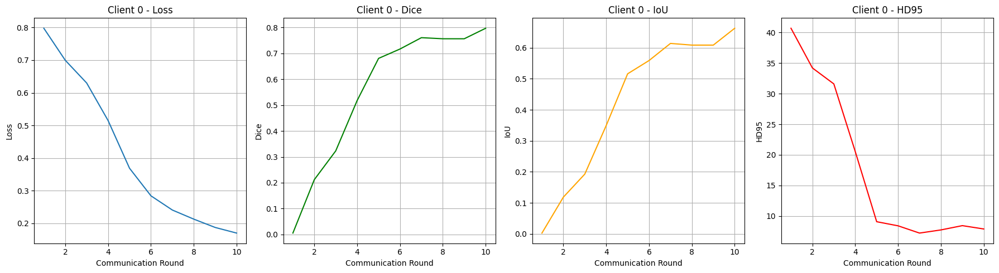

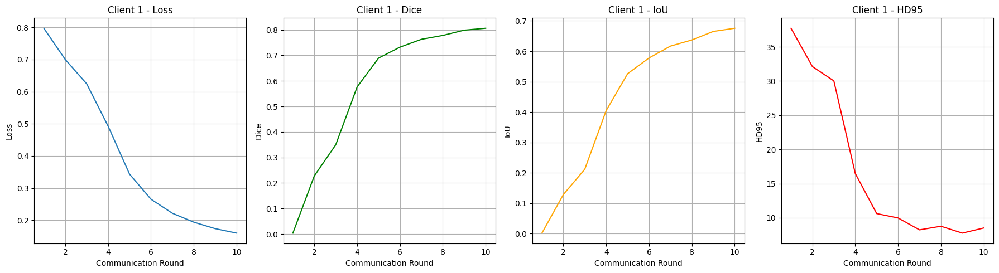

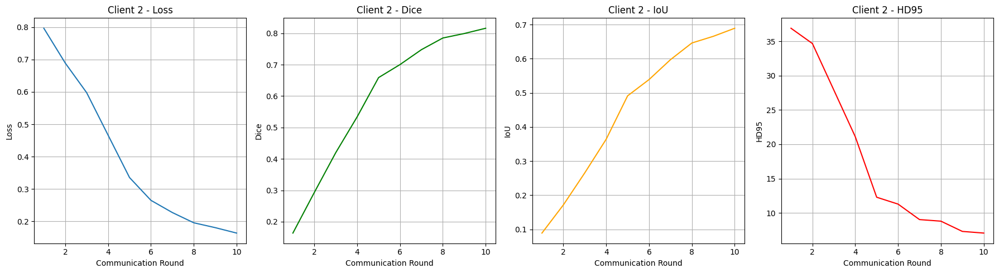

In [18]:
#local clients per communication round

for client_id, metrics in client_history.items():

    rounds = range(1, len(metrics["dice"]) + 1)

    plt.figure(figsize=(18, 5))

    # ----------------------------
    # Loss
    # ----------------------------
    plt.subplot(1, 4, 1)
    plt.plot(rounds, metrics["loss"])
    plt.xlabel("Communication Round")
    plt.ylabel("Loss")
    plt.title(f"Client {client_id} - Loss")
    plt.grid(True)

    # ----------------------------
    # Dice
    # ----------------------------
    plt.subplot(1, 4, 2)
    plt.plot(rounds, metrics["dice"], color="green")
    plt.xlabel("Communication Round")
    plt.ylabel("Dice")
    plt.title(f"Client {client_id} - Dice")
    plt.grid(True)

    # ----------------------------
    # IoU
    # ----------------------------
    plt.subplot(1, 4, 3)
    plt.plot(rounds, metrics["iou"], color="orange")
    plt.xlabel("Communication Round")
    plt.ylabel("IoU")
    plt.title(f"Client {client_id} - IoU")
    plt.grid(True)

    # ----------------------------
    # HD95
    # ----------------------------
    plt.subplot(1, 4, 4)
    plt.plot(rounds, metrics["hd95"], color="red")
    plt.xlabel("Communication Round")
    plt.ylabel("HD95")
    plt.title(f"Client {client_id} - HD95")
    plt.grid(True)

    plt.tight_layout()
    plt.show()

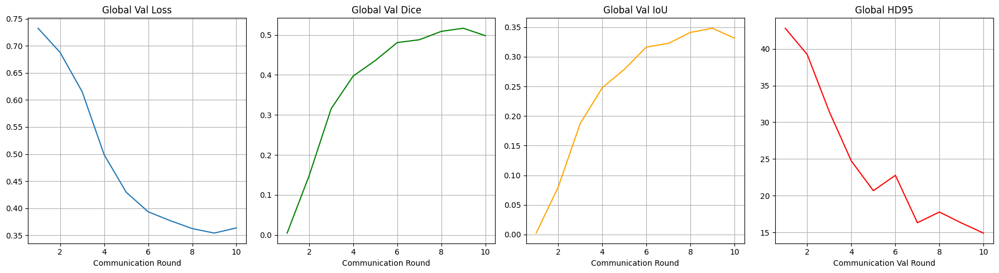

In [19]:
# Global Model per Communication Round
rounds = range(1, len(global_history["dice"]) + 1)

plt.figure(figsize=(18, 5))

plt.subplot(1,4,1)
plt.plot(rounds, global_history["loss"])
plt.xlabel("Communication Round")
plt.title("Global Val Loss")
plt.grid(True)

plt.subplot(1,4,2)
plt.plot(rounds, global_history["dice"], color="green")
plt.xlabel("Communication Round")
plt.title("Global Val Dice")
plt.grid(True)

plt.subplot(1,4,3)
plt.plot(rounds, global_history["iou"], color="orange")
plt.xlabel("Communication Round")
plt.title("Global Val IoU")
plt.grid(True)

plt.subplot(1,4,4)
plt.plot(rounds, global_history["hd95"], color="red")
plt.xlabel("Communication Val Round")
plt.title("Global HD95")
plt.grid(True)

plt.tight_layout()
plt.show()

**Test Set and Segmentation**

In [20]:
# -----------------------------
# 1️⃣ Load test set
# -----------------------------
test_dwi, test_masks = load_dwi_mask_pairs(os.path.join(data_dir, "test"))

test_dataset = ISLESDataset(
    dwi_files=test_dwi,
    mask_files=test_masks,
    image_transform=sample_transform,
    mask_transform=mask_transform
)

test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)
print("Test samples:", len(test_dataset))

# -----------------------------
# 2️⃣ Load best global model
# -----------------------------
best_model_ckpt = torch.load("best_global_model.pth")
global_model = create_model().to(device)
global_model.load_state_dict(best_model_ckpt["model_state_dict"])
global_model.eval()

# -----------------------------
# 3️⃣ Metrics setup
# -----------------------------
dice_metric = DiceMetric(include_background=False, reduction="mean")
hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

all_dice = []
all_hd95 = []
all_iou = []

from tqdm import tqdm

# -----------------------------
# 4️⃣ Evaluate on test set
# -----------------------------
global_model.eval()
all_dice = []
all_hd95 = []
all_iou = []

with torch.no_grad():
    test_bar = tqdm(test_loader, desc="Testing", leave=True)
    for batch_idx, batch in enumerate(test_bar):
        images = batch["image"].to(device, dtype=torch.float32)
        masks = batch["mask"].to(device, dtype=torch.float32)

        outputs = global_model(images)
        pred_binary = (torch.sigmoid(outputs) > 0.5).float()

        # Metrics
        dice_metric(pred_binary, masks)
        hd_metric(pred_binary, masks)

        # Optional: show running metrics in tqdm
        running_dice = dice_metric.aggregate().item()
        running_hd = hd_metric.aggregate().item()
        running_iou = running_dice / (2 - running_dice)
        test_bar.set_postfix({
            "Dice": f"{running_dice:.4f}",
            "IoU": f"{running_iou:.4f}",
            "HD95": f"{running_hd:.4f}"
        })

    # Final metrics
    mean_dice = dice_metric.aggregate().item()
    mean_hd95 = hd_metric.aggregate().item()
    mean_iou = mean_dice / (2 - mean_dice)

    print(f"\nTest Set Metrics:")
    print(f"Dice: {mean_dice:.4f}")
    print(f"IoU: {mean_iou:.4f}")
    print(f"HD95: {mean_hd95:.4f}")

    # Reset metrics for future use
    dice_metric.reset()
    hd_metric.reset()

C:\Users\LAB\AppData\Local\Temp\ipykernel_16808\1367524147.py:19: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  best_model_ckpt = torch.load("best_global_model.pth")


Test samples: 50
UNet(
  (model): Sequential(
    (0): ResidualUnit(
      (conv): Sequential(
        (unit0): Convolution(
          (conv): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1))
          (adn): ADN(
            (N): InstanceNorm3d(16, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
            (D): Dropout(p=0.0, inplace=False)
            (A): PReLU(num_parameters=1)
          )
        )
        (unit1): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
          (adn): ADN(
            (N): InstanceNorm3d(16, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
            (D): Dropout(p=0.0, inplace=False)
            (A): PReLU(num_parameters=1)
          )
        )
      )
      (residual): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1))
    )
    (1): SkipConnection(
      (submodule): Sequential(
        (0): ResidualUnit(
   

Testing:   0%|          | 0/50 [00:00<?, ?it/s, Dice=0.0084, IoU=0.0042, HD95=20.1445]c:\Users\LAB\AppData\Local\Programs\Python\Python310\lib\site-packages\monai\metrics\utils.py:332: UserWarning: the prediction of class 0 is all 0, this may result in nan/inf distance.
  warnings.warn(
Testing:  52%|█████▏    | 26/50 [00:01<00:01, 20.71it/s, Dice=0.3523, IoU=0.2138, HD95=19.4231]c:\Users\LAB\AppData\Local\Programs\Python\Python310\lib\site-packages\monai\metrics\utils.py:327: UserWarning: the ground truth of class 0 is all 0, this may result in nan/inf distance.
  warnings.warn(
Testing: 100%|██████████| 50/50 [00:02<00:00, 20.06it/s, Dice=0.4609, IoU=0.2995, HD95=17.5051]


Test Set Metrics:
Dice: 0.4609
IoU: 0.2995
HD95: 17.5051


**Visualize**

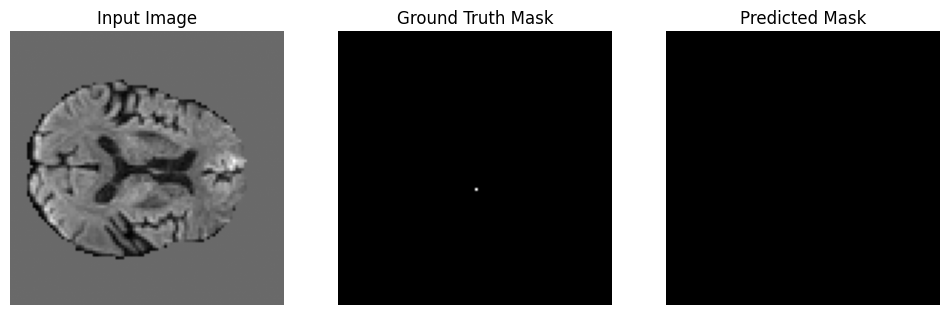

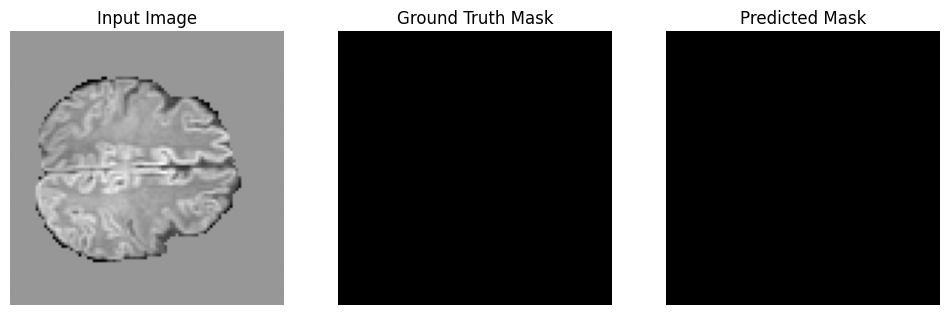

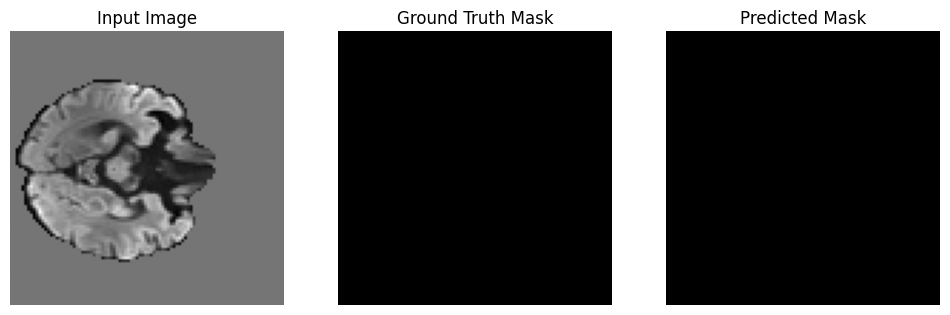

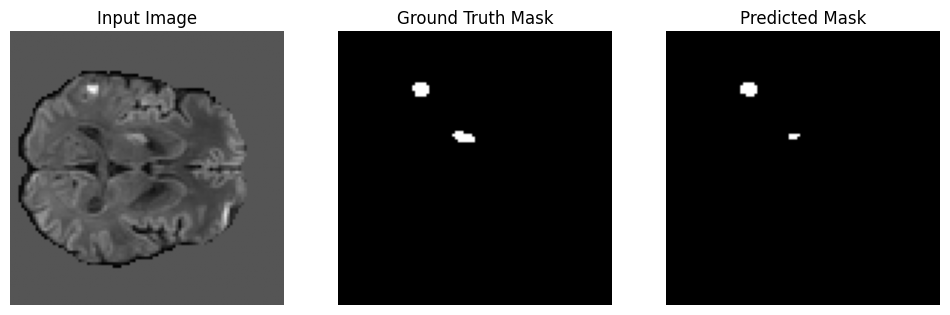

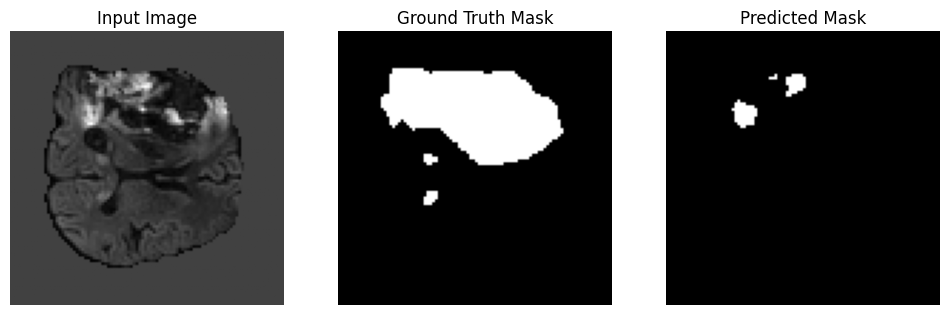

...

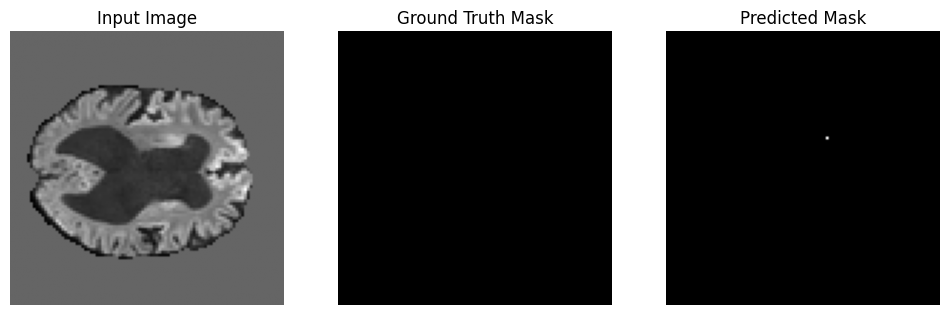

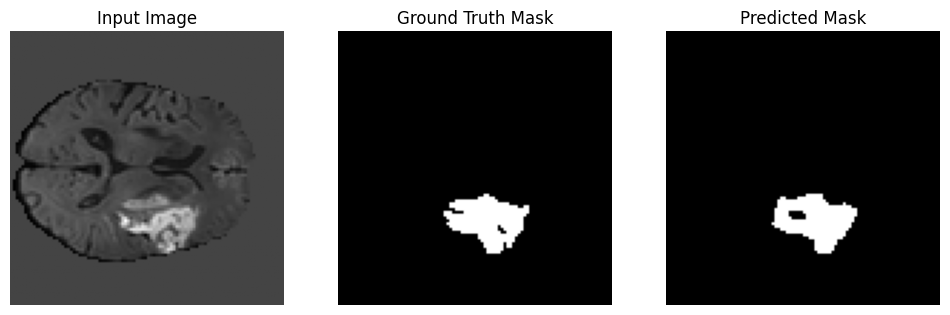

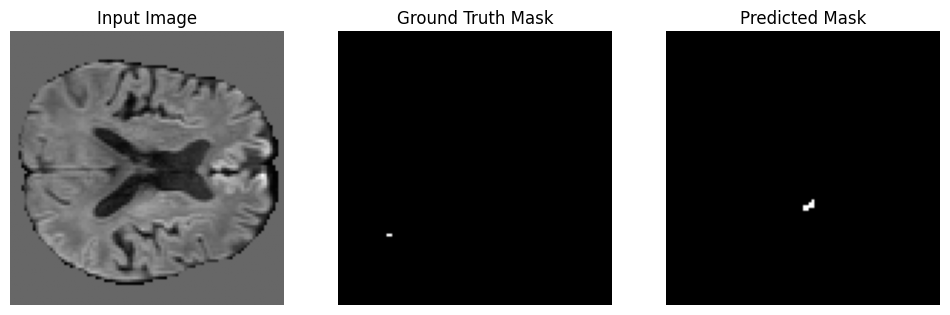

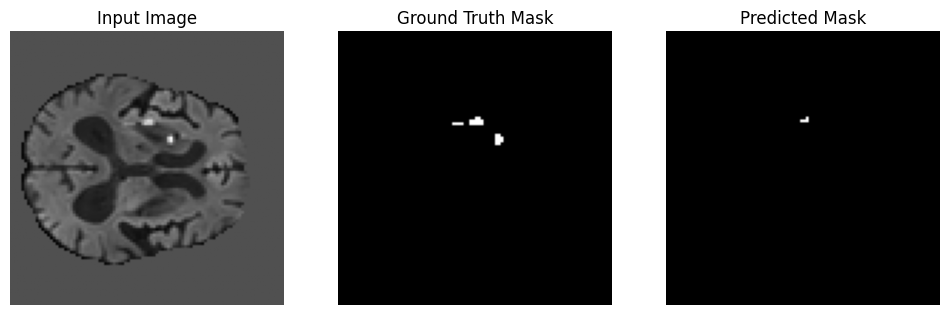

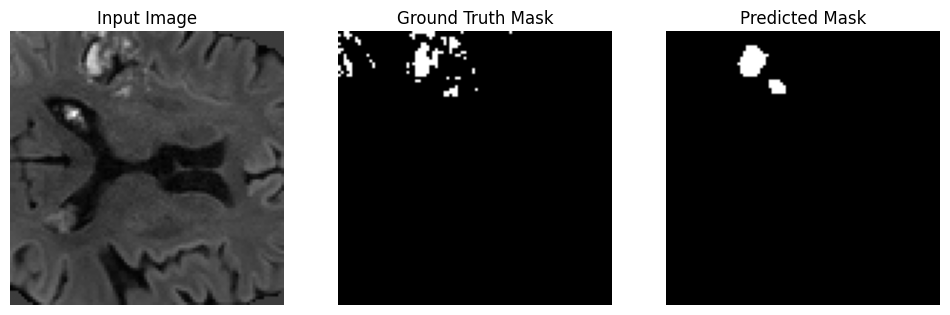

In [21]:
num_visualize = len(test_dataset)

global_model.eval()

for i in range(num_visualize):
    sample = test_dataset[i]

    # Get tensors
    image_tensor = sample["image"].unsqueeze(0).to(device, dtype=torch.float32)
    mask_tensor  = sample["mask"]

    # Convert for visualization
    image = sample["image"][0].cpu().numpy()
    mask  = sample["mask"][0].cpu().numpy()

    # Predict
    with torch.no_grad():
        output = global_model(image_tensor)
        pred = (torch.sigmoid(output)[0, 0].cpu().numpy() > 0.5).astype(float)

    # Middle slice
    mid_slice = image.shape[2] // 2
    img_slice  = image[:, :, mid_slice]
    mask_slice = mask[:, :, mid_slice]
    pred_slice = pred[:, :, mid_slice]

    # Plot
    plt.figure(figsize=(12,4))

    plt.subplot(1,3,1)
    plt.imshow(img_slice, cmap="gray")
    plt.title("Input Image")
    plt.axis("off")

    plt.subplot(1,3,2)
    plt.imshow(mask_slice, cmap="gray")
    plt.title("Ground Truth Mask")
    plt.axis("off")

    plt.subplot(1,3,3)
    plt.imshow(pred_slice, cmap="gray")
    plt.title("Predicted Mask")
    plt.axis("off")

    plt.show()